<a href="https://colab.research.google.com/github/Daudi232/DS_3/blob/main/Thesis/Classification/Classification_Custom_CNNs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# INFO

This notebook includes experiments of classification using different customized CNN models, both using the 704 and 4200 datasets.


# CONFIGURATION

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# IMPORTS AND INSTALLS

In [ ]:
!pip install torchview

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 31.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=88e05d448e6dc6062a7dcd9b8f40e5ef28f23cd1c9eb39c6b30dfd1892c59413
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [ ]:
import pandas as pd
import numpy as np
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from torchvision import datasets, transforms

# HELPER FUNCTIONS

## Training Loop

- It has been changed a lot. Newer version includes computing time.
- NB: Saving is not done on state_dict


### saving best weights

In [ ]:
def model_train_save(model, train_data_loader, val_data_loader, optimizer, loss_fn, save_path, epochs = 30, device='cpu'):


  model.to(device) # shift the model to GPU

  # Metrics
  history = {'Training': {'Loss': [], 'Accuracy': [], 'Time': []},

             'Validation': {'Loss': [], 'Accuracy': [], 'Time': []}
  }

  best_val_loss = np.inf

  for epoch in range(1, epochs+1):


    # TRAIN
    model.train() # at the start of each epoch.. this is called before training. Meaningful when we have dropout/batch normalization

    time_train_start = time.time()
    train_loss = 0 # initialized at each start of the epoch
    epoch_correct_train = 0

    for batch, target in train_data_loader:
      input = batch.to(device) #moves the input from CPU To GPU
      target = target.to(device)
      output = model(input) #forward pass
      loss = loss_fn(output, target) #compute loss

      optimizer.zero_grad() #clear out any weights to 0s
      loss.backward() #compute gradients using back-prop
      optimizer.step() # update the weights

      train_loss += loss.data.item() #loss

      batch_correct_train = (output.argmax(dim=1) == target).sum().item() #accuracy
      epoch_correct_train += batch_correct_train

    time_train = (time.time() - time_train_start)/60
    train_loss /= len(train_data_loader) #here we average the error summed for all batches
    train_acc = epoch_correct_train/len(train_data_loader.dataset)

    history['Training']['Loss'].append(train_loss)
    history['Training']['Accuracy'].append(train_acc)
    history['Training']['Time'].append(time_train)


    # EVALUATE
    model.eval()
    time_val_start = time.time()

    val_loss = 0
    epoch_correct_val = 0

    with torch.no_grad():
      for batch, targets in val_data_loader:
        input = batch.to(device) #moves the input from CPU To GPU
        targets = targets.to(device)
        output = model(input)
        loss = loss_fn(output, targets)

        val_loss = val_loss + loss.data.item()

        batch_correct_val = (output.argmax(dim=1) == targets).sum().item()
        epoch_correct_val += batch_correct_val

      val_loss = val_loss/len(val_data_loader)
      val_acc = epoch_correct_val/len(val_data_loader.dataset)

      time_val = (time.time() - time_val_start)/60

      history['Validation']['Loss'].append(val_loss)
      history['Validation']['Accuracy'].append(val_acc)
      history['Validation']['Time'].append(time_val)

      if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model, save_path)

    # Report
    print(f"Epoch: [{epoch}/{epochs}]\t Train Loss: {train_loss:.2f}\t\
    Val Loss: {val_loss:.2f}\t Train Acc: {train_acc:.2f}\t Val Acc: {val_acc:.2f}\
    Train Time: {time_train:.2f}\t Val Time: {time_val:.2f}")

  return history

### using torch.compile

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from torchvision import datasets, transforms

import numpy as np
import time


def model_train_save_optim(model, train_data_loader, val_data_loader, optimizer, loss_fn, save_path, epochs = 30, device='cpu'):


  model.to(device) # shift the model to GPU
  model = torch.compile(model) #compile

  # Metrics
  history = {'Training': {'Loss': [], 'Accuracy': [], 'Time': []},

             'Validation': {'Loss': [], 'Accuracy': [], 'Time': []}
  }

  best_val_loss = np.inf

  for epoch in range(1, epochs+1):


    # TRAIN
    model.train() # at the start of each epoch.. this is called before training. Meaningful when we have dropout/batch normalization

    time_train_start = time.time()
    train_loss = 0 # initialized at each start of the epoch
    epoch_correct_train = 0

    for batch, target in train_data_loader:
      input = batch.to(device) #moves the input from CPU To GPU
      target = target.to(device)
      output = model(input) #forward pass
      loss = loss_fn(output, target) #compute loss

      optimizer.zero_grad() #clear out any weights to 0s
      loss.backward() #compute gradients using back-prop
      optimizer.step() # update the weights

      train_loss += loss.data.item() #loss

      batch_correct_train = (output.argmax(dim=1) == target).sum().item() #accuracy
      epoch_correct_train += batch_correct_train

    time_train = (time.time() - time_train_start)/60
    train_loss /= len(train_data_loader) #here we average the error summed for all batches
    train_acc = epoch_correct_train/len(train_data_loader.dataset)

    history['Training']['Loss'].append(train_loss)
    history['Training']['Accuracy'].append(train_acc)
    history['Training']['Time'].append(time_train)


    # EVALUATE
    model.eval()
    time_val_start = time.time()

    val_loss = 0
    epoch_correct_val = 0

    with torch.no_grad():
      for batch, targets in val_data_loader:
        input = batch.to(device) #moves the input from CPU To GPU
        targets = targets.to(device)
        output = model(input)
        loss = loss_fn(output, targets)

        val_loss = val_loss + loss.data.item()

        batch_correct_val = (output.argmax(dim=1) == targets).sum().item()
        epoch_correct_val += batch_correct_val

      val_loss = val_loss/len(val_data_loader)
      val_acc = epoch_correct_val/len(val_data_loader.dataset)

      time_val = (time.time() - time_val_start)/60

      history['Validation']['Loss'].append(val_loss)
      history['Validation']['Accuracy'].append(val_acc)
      history['Validation']['Time'].append(time_val)

      if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model, save_path)

    # Report
    print(f"Epoch: [{epoch}/{epochs}]\t Train Loss: {train_loss:.2f}\t\
    Val Loss: {val_loss:.2f}\t Train Acc: {train_acc:.2f}\t Val Acc: {val_acc:.2f}\
    Train Time: {time_train:.2f}\t Val Time: {time_val:.2f}")

  return history

### with early stopping

In [ ]:
def model_train_save_es(model, train_data_loader, val_data_loader, optimizer, loss_fn, save_path, epochs = 30, patience = 10, device='cpu'):


  model.to(device) # shift the model to GPU

  # Metrics
  history = {'Training': {'Loss': [], 'Accuracy': [], 'Time': []},

             'Validation': {'Loss': [], 'Accuracy': [], 'Time': []}
  }

  best_val_loss = np.inf # for checkpointing best model
  count = 0 # for early stopping

  for epoch in range(1, epochs+1):

    # TRAIN
    model.train() # at the start of each epoch.. this is called before training. Meaningful when we have dropout/batch normalization

    time_train_start = time.time()
    train_loss = 0 # initialized at each start of the epoch
    epoch_correct_train = 0

    for batch, target in train_data_loader:
      input = batch.to(device) #moves the input from CPU To GPU
      target = target.to(device)
      output = model(input) #forward pass
      loss = loss_fn(output, target) #compute loss

      optimizer.zero_grad() #clear out any weights to 0s
      loss.backward() #compute gradients using back-prop
      optimizer.step() # update the weights

      train_loss += loss.data.item() #loss

      batch_correct_train = (output.argmax(dim=1) == target).sum().item() #accuracy
      epoch_correct_train += batch_correct_train

    time_train = (time.time() - time_train_start)/60
    train_loss /= len(train_data_loader) #here we average the error summed for all batches
    train_acc = epoch_correct_train/len(train_data_loader.dataset)

    history['Training']['Loss'].append(train_loss)
    history['Training']['Accuracy'].append(train_acc)
    history['Training']['Time'].append(time_train)


    # EVALUATE
    model.eval()
    time_val_start = time.time()

    val_loss = 0
    epoch_correct_val = 0

    with torch.no_grad():
      for batch, targets in val_data_loader:
        input = batch.to(device) #moves the input from CPU To GPU
        targets = targets.to(device)
        output = model(input)
        loss = loss_fn(output, targets)

        val_loss = val_loss + loss.data.item()

        batch_correct_val = (output.argmax(dim=1) == targets).sum().item()
        epoch_correct_val += batch_correct_val

      val_loss = val_loss/len(val_data_loader)
      val_acc = epoch_correct_val/len(val_data_loader.dataset)

      time_val = (time.time() - time_val_start)/60

      history['Validation']['Loss'].append(val_loss)
      history['Validation']['Accuracy'].append(val_acc)
      history['Validation']['Time'].append(time_val)

    if val_loss < best_val_loss:
      best_val_loss = val_loss
      count = 0 # initialize the early stopping counter
      torch.save(model, save_path)

    else: count += 1

    if count >= patience:
      print(f"Early stopping triggered at Epoch: {epoch}")
      break

    # Report
    print(f"Epoch: [{epoch}/{epochs}]\t Train Loss: {train_loss:.2f}\t\
    Val Loss: {val_loss:.2f}\t Train Acc: {train_acc:.2f}\t Val Acc: {val_acc:.2f}\
    Train Time: {time_train:.2f}\t Val Time: {time_val:.2f}")

  return history

## Predicting


### with test set

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time

def model_predict(load_path, test_data_loader, device):

  model = torch.load(load_path, weights_only = False)

  model.to(device)
  model.eval()
  test_time_start = time.time()

  predictions = []
  actual = []
  all_probs = []


  with torch.no_grad():
    for batch, targets in test_data_loader:
      inputs, outputs = batch.to(device), targets.to(device)
      output = model(inputs)

      #predictions and targets
      predictions.append(output.argmax(dim = 1).cpu())
      actual.append(targets.cpu())

      #probabilities
      probs = F.softmax(output, dim = 1) # apply softmax to the batch, along the columns
      pos_probs = probs[:, 1] # fetch the second value, corresponding to class 1
      all_probs.append(pos_probs.cpu())

  test_time = (time.time() - test_time_start)/60

  combo_predictions = torch.cat(predictions, dim = 0)
  combo_targets = torch.cat(actual, dim = 0)
  combo_probs = torch.cat(all_probs, dim = 0)

  correct = (combo_predictions == combo_targets).sum().item()
  accuracy = correct/len(test_data_loader.dataset)

  f1 = f1_score(combo_targets.numpy(), combo_predictions.numpy())
  auc = roc_auc_score(combo_targets.numpy(), combo_probs.numpy())

  print('Prediction Metrics')
  print(f'Confusion Matrix: {confusion_matrix (combo_targets.numpy(), combo_predictions.numpy())}')
  print(f'Test Accuracy: {accuracy:.2f}')
  print(f'Test f1: {f1:.2f}')
  print(f'Test AUC: {auc:.2f}')
  print(f'Time: {test_time:.2f}')

  # Plotting the ROC

  fpr, tpr, thresholds = roc_curve(combo_targets.numpy(), combo_probs.numpy()) # <--- Get FPR and TPR

  plt.figure(figsize=(8, 6))
  plt.plot(fpr, tpr, label=f'Model (AUC = {auc:.4f})') # <--- Plot the ROC curve
  plt.plot([0, 1], [0, 1], 'r--', label='Random Guess') # <--- Plot the diagonal line
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC Curve')
  plt.legend()
  plt.grid(True)
  plt.show(); # <--- Display the plot


  return combo_predictions, all_probs, combo_targets

### with validation set

I think it is the same code, just different names. The idea was to avoid information leak when running multiple experiment runs

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, f1_score
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time

def model_predict_val(load_path, val_data_loader, device):

  model = torch.load(load_path, weights_only = False)

  model.to(device)
  model.eval()
  test_time_start = time.time()

  predictions = []
  actual = []
  all_probs = []


  with torch.no_grad():
    for batch, targets in val_data_loader:
      inputs, outputs = batch.to(device), targets.to(device)
      output = model(inputs)

      #predictions and targets
      predictions.append(output.argmax(dim = 1).cpu())
      actual.append(targets.cpu())

      #probabilities
      probs = F.softmax(output, dim = 1) # apply softmax to the batch, along the columns
      pos_probs = probs[:, 1] # fetch the second value, corresponding to class 1
      all_probs.append(pos_probs.cpu())

  test_time = (time.time() - test_time_start)/60

  combo_predictions = torch.cat(predictions, dim = 0)
  combo_targets = torch.cat(actual, dim = 0)
  combo_probs = torch.cat(all_probs, dim = 0)

  correct = (combo_predictions == combo_targets).sum().item()
  accuracy = correct/len(val_data_loader.dataset)

  f1 = f1_score(combo_targets.numpy(), combo_predictions.numpy())
  auc = roc_auc_score(combo_targets.numpy(), combo_probs.numpy())


  print('Prediction Metrics')
  print(f'Confusion Matrix: {confusion_matrix (combo_targets.numpy(), combo_predictions.numpy())}')
  print(f'Accuracy: {accuracy:.2f}')
  print(f'f1: {f1:.2f}')
  print(f'AUC: {auc:.2f}')
  print(f'Time: {test_time:.2f}')

  # Plotting the ROC

  fpr, tpr, thresholds = roc_curve(combo_targets.numpy(), combo_probs.numpy()) # <--- Get FPR and TPR

  plt.figure(figsize=(8, 6))
  plt.plot(fpr, tpr, label=f'Model (AUC = {auc:.4f})') # <--- Plot the ROC curve
  plt.plot([0, 1], [0, 1], 'r--', label='Random Guess') # <--- Plot the diagonal line
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC Curve')
  plt.legend()
  plt.grid(True)
  plt.show(); # <--- Display the plot


  return combo_predictions, all_probs, combo_targets

## Plotting

In [ ]:
import matplotlib.pyplot as plt

def plot_results_new(history:dict):

  x = range(1, len(history['Training']['Loss'])+1)
  plt.plot(x, history['Training']['Loss'], label = 'Training Loss')
  plt.plot(x, history['Validation']['Loss'], label = 'Validation Loss')
  plt.legend()
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Training and Validation Loss')
  plt.show();

  plt.plot(x, history['Training']['Accuracy'], label = 'Training Accuracy')
  plt.plot(x, history['Validation']['Accuracy'], label = 'Validation Accuracy')
  plt.legend()
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.title('Training and Validation Accuracy')
  plt.show();


# DATA (704)

#### Notes for section:

__On exploration of metadata__

- Looks like we have 704 images, the id column of the metadata should have a correspondence with the naming of the images (not confirmed, but more likely)

- Every image seems to have its segmentation masks, since we have 704 segmentation masks.

- The age column is pretty messed up. We have a combination of strings integers and texts with integers. The gender column is also pretty messed up.

- The distribution of positive and negative classes is balanced.

### Dataset Downloading

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("iamtapendu/chest-x-ray-lungs-segmentation")

print("Path to dataset files:", path)

100%|██████████| 3.59G/3.59G [00:43<00:00, 89.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/iamtapendu/chest-x-ray-lungs-segmentation/versions/1


### Structure and exploration

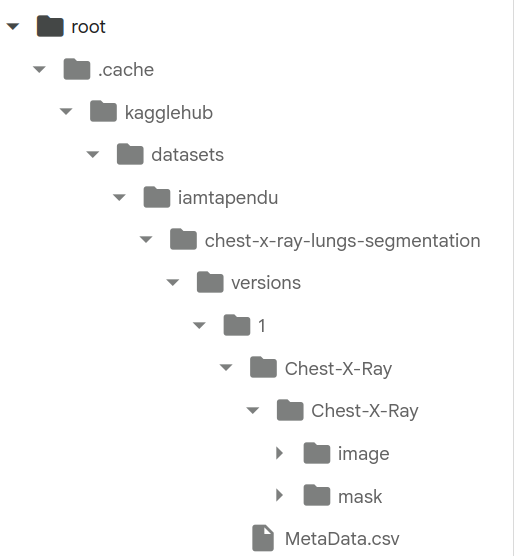

In [ ]:
import os

os.listdir(path)

['MetaData.csv', 'Chest-X-Ray']

In [ ]:
os.listdir(os.path.join(path, 'Chest-X-Ray'))

['Chest-X-Ray']

In [ ]:
os.listdir(os.path.join(path, 'Chest-X-Ray', 'Chest-X-Ray'))

['image', 'mask']

In [ ]:
list_images = os.listdir(os.path.join(path, 'Chest-X-Ray', 'Chest-X-Ray', 'image'))

In [ ]:
len(list_images)

704

In [ ]:
list_masks = os.listdir(os.path.join(path, 'Chest-X-Ray', 'Chest-X-Ray', 'mask'))

In [ ]:
len(list_masks)

704

In [ ]:
import pandas as pd
metadata = pd.read_csv(os.path.join(path, 'MetaData.csv'))

In [ ]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 704 entries, 0 to 703
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       704 non-null    int64 
 1   gender   704 non-null    object
 2   age      704 non-null    object
 3   county   704 non-null    object
 4   ptb      704 non-null    int64 
 5   remarks  699 non-null    object
dtypes: int64(2), object(4)
memory usage: 33.1+ KB


In [ ]:
metadata.head()

,id,gender,age,county,ptb,remarks
0,1000,male,31,Shenxhen,0,normal
1,1001,male,64,Shenxhen,0,normal
2,1002,male,35,Shenxhen,0,normal
3,1003,male,32,Shenxhen,1,"STB,ATB,tuberculosis pleuritis"
4,1004,male,2,Shenxhen,1,secondary PTB in the bilateral upper field


In [ ]:
metadata['county'].value_counts()

,count
county,
Shenxhen,566
Montgomery,138


In [ ]:
metadata['ptb'].value_counts(normalize=True)

,proportion
ptb,
0,0.509943
1,0.490057


In [ ]:
metadata['id'].max()

1703

In [ ]:
metadata['gender'].value_counts()

,count
gender,
male,358
female,176
F,74
M,63
Male,12
"Male,",6
"Female,",5
femal,3
Female,3


In [ ]:
metadata['gender'].value_counts(normalize = True)

,proportion
gender,
male,0.508523
female,0.250000
F,0.105114
M,0.089489
Male,0.017045
"Male,",0.008523
"Female,",0.007102
femal,0.004261
Female,0.004261


In [ ]:
metadata['age'].head(10)

,age
0,31
1,64
2,35
3,32
4,2
5,17
6,25
7,30
8,27
9,31


In [ ]:
metadata['age'].min()

'004'

In [ ]:
metadata['age'].max()

'male35'

In [ ]:
metadata['age'].unique()

array(['31', '64', '35', '32', '2', '17', '25', '30', '27', '37', '26',
       '46', '57', '23', '33', '45', '74', '48', '20', '56', '39', '43',
       '38', '65', '28', '47', '60', '29', '34', '5', '22', '24', '68',
       '42', '18', '1', '78', '53', '21', '59', '8', '63', '75', '19',
       '36', '51', '40', '69', '61', '41', '15', '49', '52', '62', '85',
       '50', '44', '71', '10', '58', '55', '1yr', '6', '76', '7', '54',
       '39yr', '16month', '3', '67', '81', 'male35', '70', 'female24',
       '14', '82', '89', '035', '032', '061', '046', '077', '049', '053',
       '043', '039', '030', '024', '037', '028', '009', '011', '063',
       '031', '067', '021', '052', '038', '044', '054', '088', '014',
       '047', '042', '020', '008', '033', '034', '051', '005', '015',
       '025', '016', '045', '048', '069', '065', '036', '050', '056',
       '089', '017', '041', '027', '023', '026', '029', '070', '018',
       '040', '010', '019', '004', '084', '085', '068', '059', '073'],
 

## SET UP OF THE DATABASE

In [ ]:
import os
import pandas as pd

# load the metadata
metadata = pd.read_csv(os.path.join(path, 'MetaData.csv'))
display (metadata.head())

# Get the ids of the images corr to TB and no-TB
img_id1 = list (metadata['id'][metadata['ptb'] == 1])
img_id0 = list(metadata['id'][metadata['ptb'] == 0])

print()
print(f'# of TB images: {len(img_id1)}')
print(f'# of Normal images: {len(img_id0)}')
print(f'Total: {len(img_id1) + len(img_id0)}')
print(img_id1[:5]) #the list is ordered in ascending
print(img_id0[:5])


# We will split train, validation and test set using 70%, 20% and 10%.
# We will consider these ratios at the class level since we want every set
# have a balanced number of images wrt the classes.

train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# int uses floor, so the test set will have a couple more images than intended
train_no_1 = int(train_ratio * len(img_id1))
train_no_0 = int(train_ratio * len(img_id0))
print(f'Train: {train_no_1} + {train_no_0} = {train_no_1 + train_no_0}')

val_no_1 = int(val_ratio * len(img_id1))
val_no_0 = int(val_ratio * len(img_id0))
print(f'Validation: {val_no_1} + {val_no_0} = {val_no_1 + val_no_0}')

test_no_1 = int(test_ratio * len(img_id1))
test_no_0 = int(test_ratio * len(img_id0))
print(f'Test: {test_no_1} + {test_no_0} = {test_no_1 + test_no_0}')

# split
train_1 = img_id1[:train_no_1]
train_0 = img_id0[:train_no_0]
train = train_1 + train_0
print(f'Train set #: {len(train)}')

val_1 = img_id1[train_no_1:train_no_1 + val_no_1]
val_0 = img_id0[train_no_0:train_no_0 + val_no_0]
val = val_1 + val_0
print(f'Validation set #: {len(val)}')

test_1 = img_id1[train_no_1 + val_no_1:]
test_0 = img_id0[train_no_0 + val_no_0:]
test = test_1 + test_0
print(f'Test set #: {len(test)}')

print(f'Total: {len(train) + len(val) + len(test)}')

,id,gender,age,county,ptb,remarks
0,1000,male,31,Shenxhen,0,normal
1,1001,male,64,Shenxhen,0,normal
2,1002,male,35,Shenxhen,0,normal
3,1003,male,32,Shenxhen,1,"STB,ATB,tuberculosis pleuritis"
4,1004,male,2,Shenxhen,1,secondary PTB in the bilateral upper field



# of TB images: 345
# of Normal images: 359
Total: 704
[1003, 1004, 1006, 1008, 1009]
[1000, 1001, 1002, 1005, 1007]
Train: 241 + 251 = 492
Validation: 69 + 71 = 140
Test: 34 + 35 = 69
Train set #: 492
Validation set #: 140
Test set #: 72
Total: 704


In [ ]:
## set up directories

import os
import shutil

sets = ['train', 'val', 'test']
klases = ['tb', 'no_tb']

current_path = os.getcwd()

# train_dir = os.makedirs(os.path.join(current_path, sets[0]))
# val_dir = os.makedirs(os.path.join(current_path, sets[1]))
# test_dir = os.makedirs(os.path.join(current_path, sets[2]))

for s in sets:
    for klas in klases:
      if not os.path.exists(os.path.join(current_path, s, klas)):
        os.makedirs(os.path.join(current_path, s, klas))

path_images = os.path.join(path, 'Chest-X-Ray/Chest-X-Ray/image')

# copying from the image path to set up directories

#train
for i in train_1:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'train/tb'))

for i in train_0:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'train/no_tb'))

# val
for i in val_1:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'val/tb'))

for i in val_0:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'val/no_tb'))

#test
for i in test_1:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'test/tb'))

for i in test_0:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'test/no_tb'))

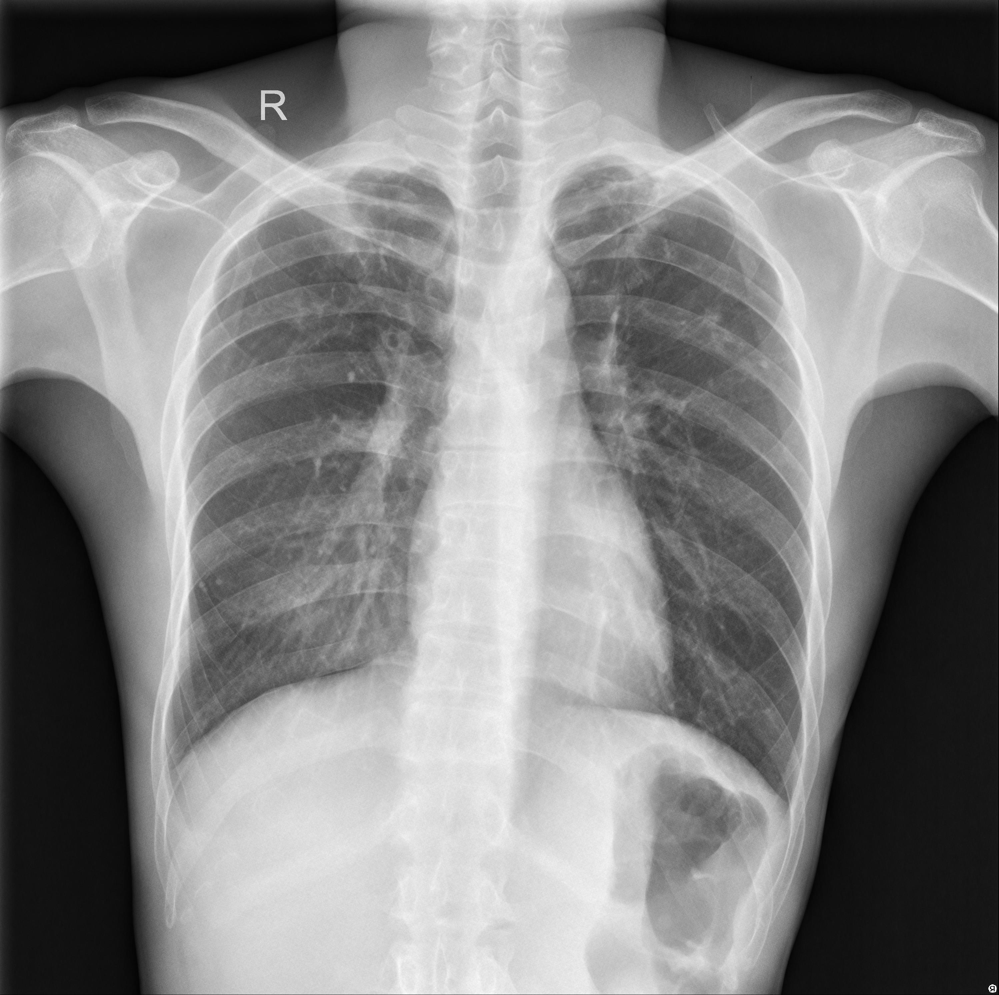

In [ ]:
# show sample image

import PIL

path_image = './train/tb/' + str(train_1[1]) + '.png'
PIL.Image.open(path_image)

## EXPERIMENT 1 (without augmentation)

Key observations

- Regularization improves the performance on the test set.
- Dropout is observed to be better than augmentation or batch norm.
- A simple CONV net with 2 layers showed the best performance than more deeper ones.

### Data Pipeline

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim


from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

from torchview import draw_graph
# from utils import model_train_save, model_predict, plot_results_new

# TRANSFORMS

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

# TENSOR DATASETS
train_td = ImageFolder(root = './train', transform = transforms)
val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

print(train_td[0][0])

# TO BATCHES
train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

tensor([[[0.0353, 0.0353, 0.0353,  ..., 0.0706, 0.1059, 0.1529],
         [0.0353, 0.0353, 0.0353,  ..., 0.0667, 0.1020, 0.1490],
         [0.0353, 0.0353, 0.0353,  ..., 0.0667, 0.1020, 0.1490],
         ...,
         [0.0275, 0.0275, 0.0275,  ..., 0.0941, 0.2863, 0.1765],
         [0.0471, 0.0471, 0.0431,  ..., 0.2745, 0.6000, 0.4157],
         [0.0588, 0.0588, 0.0588,  ..., 0.1647, 0.4039, 0.2588]],

        [[0.0353, 0.0353, 0.0353,  ..., 0.0706, 0.1059, 0.1529],
         [0.0353, 0.0353, 0.0353,  ..., 0.0667, 0.1020, 0.1490],
         [0.0353, 0.0353, 0.0353,  ..., 0.0667, 0.1020, 0.1490],
         ...,
         [0.0275, 0.0275, 0.0275,  ..., 0.0941, 0.2863, 0.1765],
         [0.0471, 0.0471, 0.0431,  ..., 0.2745, 0.6000, 0.4157],
         [0.0588, 0.0588, 0.0588,  ..., 0.1647, 0.4039, 0.2588]],

        [[0.0353, 0.0353, 0.0353,  ..., 0.0706, 0.1059, 0.1529],
         [0.0353, 0.0353, 0.0353,  ..., 0.0667, 0.1020, 0.1490],
         [0.0353, 0.0353, 0.0353,  ..., 0.0667, 0.1020, 0.

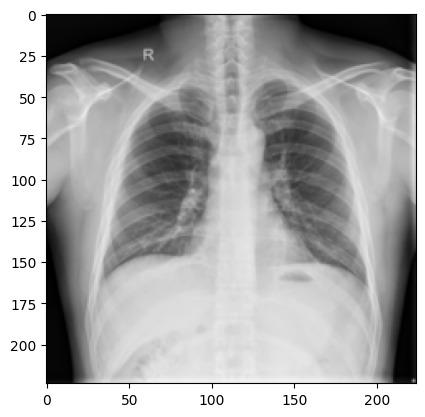

In [ ]:
plt.imshow(train_td[0][0].permute(1, 2, 0));

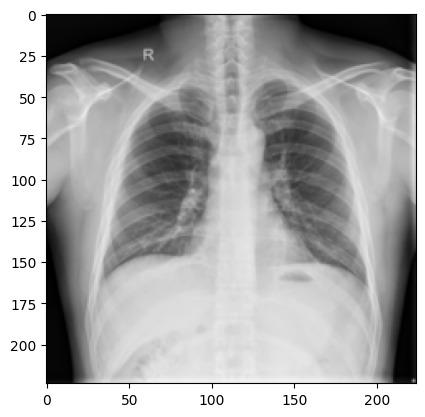

In [ ]:
plt.imshow(train_td[0][0].permute(1, 2, 0), cmap = 'gray');

### run 1 (complex without regu)

setup
- 4 CONV blocks, increasing filters (32-256)
- 1 Dense layer

results
- model trains to about 90% accuracy
- validation accuracy does not exceed 61%
- test set acc is just 49%, worse than guessing

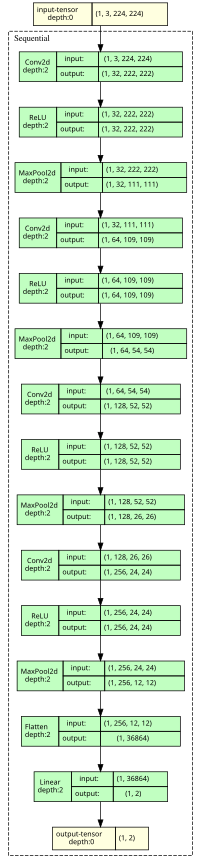

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 32, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),

        nn.Conv2d(32, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Conv2d(64, 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Conv2d(128, 256, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Flatten(),
        nn.Linear(36864, 2)
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/30]	 Train Loss: 0.72	 Val Loss: 0.69	 Val Acc = 0.50
Epoch: [2/30]	 Train Loss: 0.65	 Val Loss: 0.78	 Val Acc = 0.49
Epoch: [3/30]	 Train Loss: 0.55	 Val Loss: 0.86	 Val Acc = 0.54
Epoch: [4/30]	 Train Loss: 0.54	 Val Loss: 0.85	 Val Acc = 0.60
Epoch: [5/30]	 Train Loss: 0.48	 Val Loss: 1.25	 Val Acc = 0.57
Epoch: [6/30]	 Train Loss: 0.50	 Val Loss: 1.20	 Val Acc = 0.57
Epoch: [7/30]	 Train Loss: 0.47	 Val Loss: 0.95	 Val Acc = 0.60
Epoch: [8/30]	 Train Loss: 0.45	 Val Loss: 1.22	 Val Acc = 0.55
Epoch: [9/30]	 Train Loss: 0.46	 Val Loss: 1.15	 Val Acc = 0.56
Epoch: [10/30]	 Train Loss: 0.43	 Val Loss: 1.60	 Val Acc = 0.55
Epoch: [11/30]	 Train Loss: 0.46	 Val Loss: 1.47	 Val Acc = 0.53
Epoch: [12/30]	 Train Loss: 0.43	 Val Loss: 1.38	 Val Acc = 0.59
Epoch: [13/30]	 Train Loss: 0.41	 Val Loss: 2.43	 Val Acc = 0.56
Epoch: [14/30]	 Train Loss: 0.45	 Val Loss: 1.35	 Val Acc = 0.56
Epoch: [15/30]	 Train Loss: 0.45	 Val Loss: 1.63	 Val Acc = 0.59
Epoch: [16/30]	 Train Loss: 0.40	 

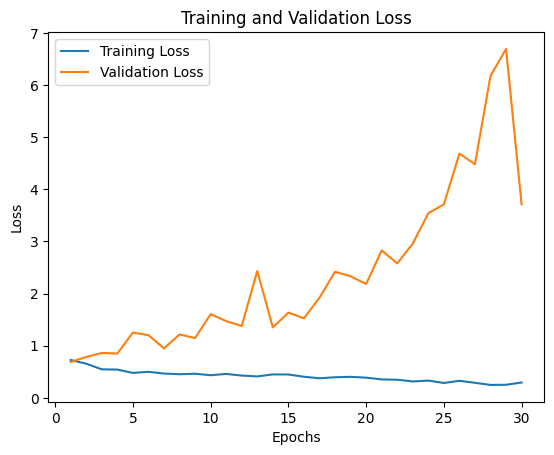

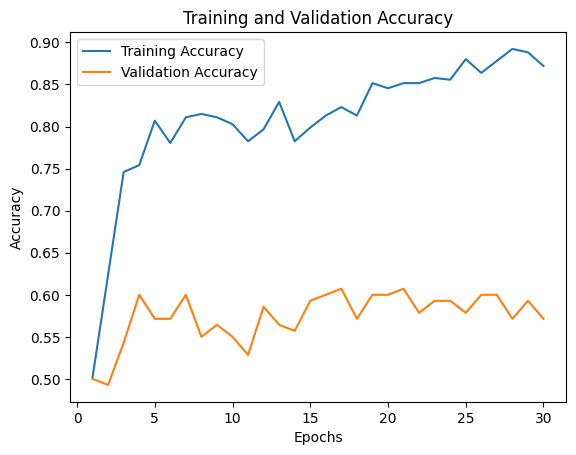

Test set accuracy: 0.49


In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 30, device = device
)

#plot
plot_results_new(history)

#predict
predictions, labels = model_predict(save_path, test_dl, device)

### run 2 (+model complexity, dropout)

setup ( I am not very sure coz the class definition is not present)
- Still 4 CONV layers, but more filters (64-512)
- More dense layers
- Dropout


results
- few epochs are used, so trend is not clear
- training acc reduces, so model does not memorize
- validation acc reaches 67%
- test acc incr to 61%

Epoch: [1/10]	 Train Loss: 2.56	 Val Loss: 0.72	 Val Acc = 0.49
Epoch: [2/10]	 Train Loss: 0.69	 Val Loss: 0.69	 Val Acc = 0.54
Epoch: [3/10]	 Train Loss: 0.69	 Val Loss: 0.70	 Val Acc = 0.51
Epoch: [4/10]	 Train Loss: 0.67	 Val Loss: 0.69	 Val Acc = 0.57
Epoch: [5/10]	 Train Loss: 0.63	 Val Loss: 0.67	 Val Acc = 0.67
Epoch: [6/10]	 Train Loss: 0.55	 Val Loss: 0.76	 Val Acc = 0.56
Epoch: [7/10]	 Train Loss: 0.51	 Val Loss: 0.88	 Val Acc = 0.57
Epoch: [8/10]	 Train Loss: 0.50	 Val Loss: 0.84	 Val Acc = 0.58
Epoch: [9/10]	 Train Loss: 0.50	 Val Loss: 0.85	 Val Acc = 0.55
Epoch: [10/10]	 Train Loss: 0.49	 Val Loss: 1.13	 Val Acc = 0.59


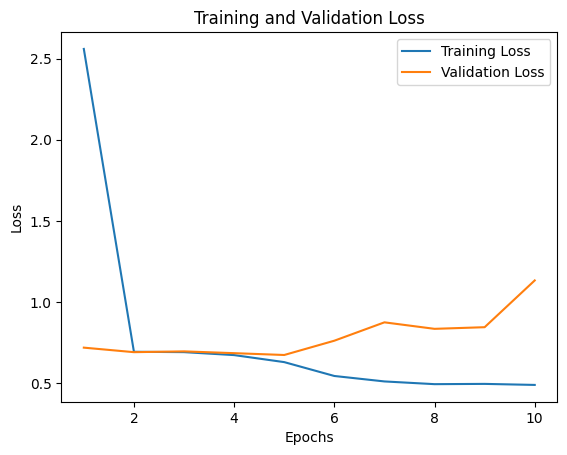

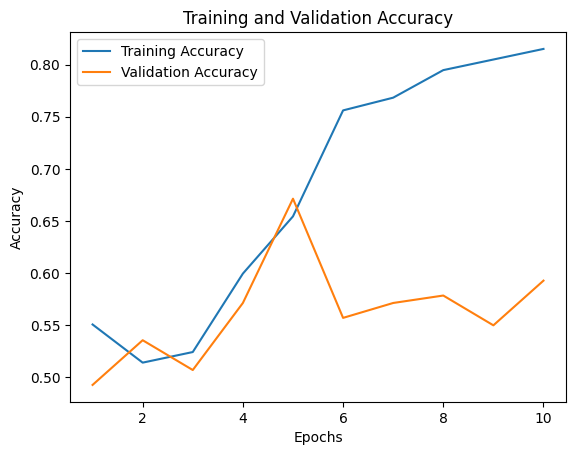

Test set accuracy: 0.61


In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 10, device = device
)

#plot
plot_results_new(history)

#predict
predictions, labels = model_predict(save_path, test_dl, device)

### run 3

setup
- same as run 2 (which makes me doubt run 2)

results
- bad. few epochs contributed to it

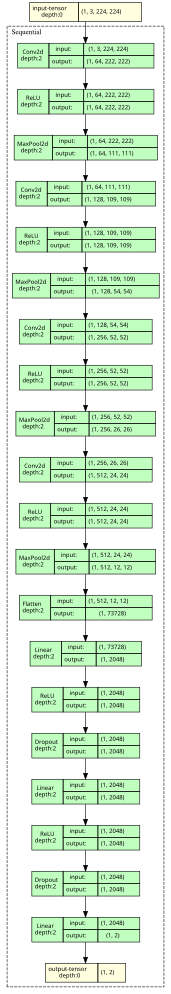

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),

        nn.Conv2d(64, 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Conv2d(128, 256, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Conv2d(256, 512, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Flatten(),
        nn.Linear(73728, 2048),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(2048, 2048),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(2048, 2)
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/10]	 Train Loss: 1.13	 Val Loss: 0.69	 Val Acc = 0.49
Epoch: [2/10]	 Train Loss: 0.69	 Val Loss: 0.69	 Val Acc = 0.49
Epoch: [3/10]	 Train Loss: 0.69	 Val Loss: 0.69	 Val Acc = 0.51
Epoch: [4/10]	 Train Loss: 0.69	 Val Loss: 0.69	 Val Acc = 0.53
Epoch: [5/10]	 Train Loss: 0.63	 Val Loss: 0.97	 Val Acc = 0.51
Epoch: [6/10]	 Train Loss: 0.52	 Val Loss: 1.19	 Val Acc = 0.59
Epoch: [7/10]	 Train Loss: 0.53	 Val Loss: 0.82	 Val Acc = 0.57
Epoch: [8/10]	 Train Loss: 0.48	 Val Loss: 1.08	 Val Acc = 0.55
Epoch: [9/10]	 Train Loss: 0.47	 Val Loss: 1.25	 Val Acc = 0.56
Epoch: [10/10]	 Train Loss: 0.47	 Val Loss: 1.11	 Val Acc = 0.55


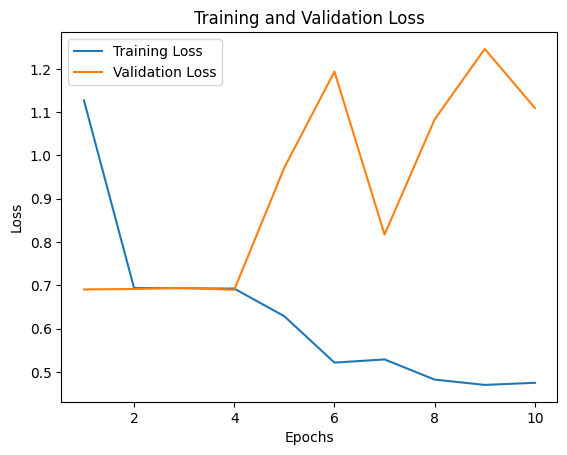

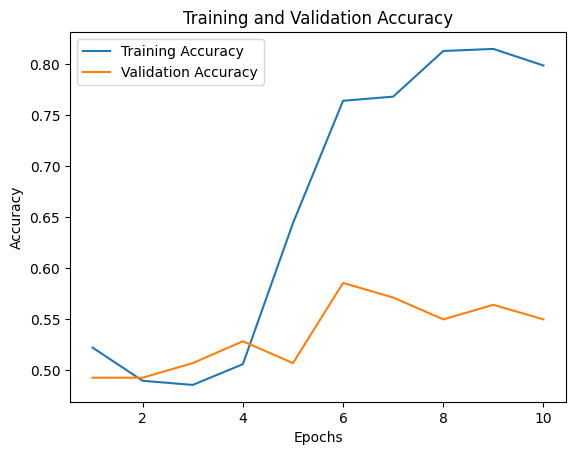

Test set accuracy: 0.49


In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 10, device = device
)

#plot
plot_results_new(history)

#predict
predictions, labels = model_predict(save_path, test_dl, device)

### run 4

setup
- 3 CONV layers, reducing fliters (123, 64, 64)
- 2 dense layers
- Dropout in CONV and deep (0.3, 0.5, 0.5, 0.2)

results
- few epochs are used, so trend is not clear
- training acc goes to 80 max, so model does not memorize
- validation acc reaches 61%
- test acc incr to 60%. not sure this will be robust though, coz i don't see a good trend in training

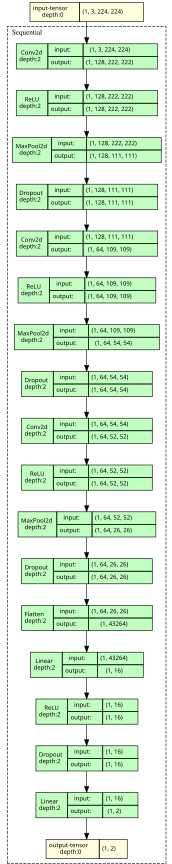

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.3),

        nn.Conv2d(128, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Conv2d(64, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Flatten(),
        nn.Linear(43264, 16),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(16, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/10]	 Train Loss: 0.71	 Val Loss: 0.69	 Val Acc = 0.44
Epoch: [2/10]	 Train Loss: 0.68	 Val Loss: 0.69	 Val Acc = 0.53
Epoch: [3/10]	 Train Loss: 0.64	 Val Loss: 0.68	 Val Acc = 0.61
Epoch: [4/10]	 Train Loss: 0.61	 Val Loss: 0.67	 Val Acc = 0.58
Epoch: [5/10]	 Train Loss: 0.60	 Val Loss: 0.67	 Val Acc = 0.60
Epoch: [6/10]	 Train Loss: 0.61	 Val Loss: 0.68	 Val Acc = 0.54
Epoch: [7/10]	 Train Loss: 0.67	 Val Loss: 0.75	 Val Acc = 0.53
Epoch: [8/10]	 Train Loss: 0.56	 Val Loss: 1.34	 Val Acc = 0.55
Epoch: [9/10]	 Train Loss: 0.51	 Val Loss: 1.46	 Val Acc = 0.54
Epoch: [10/10]	 Train Loss: 0.50	 Val Loss: 1.22	 Val Acc = 0.59


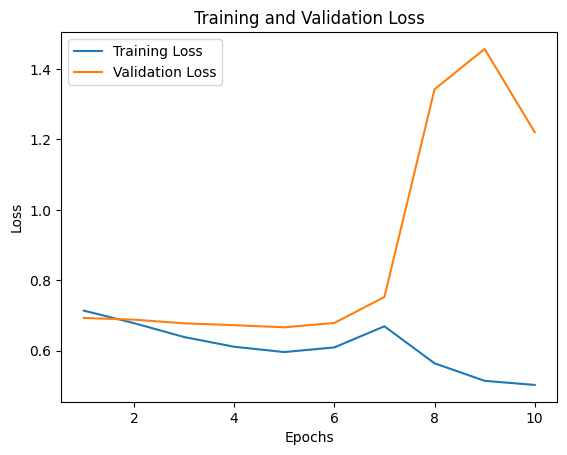

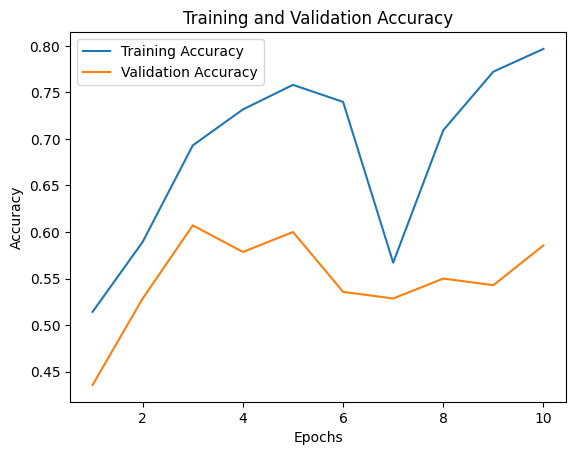

Test set accuracy: 0.60


In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 10, device = device
)

#plot
plot_results_new(history)

#predict
predictions, labels = model_predict(save_path, test_dl, device)

### run 5 (small CONV).. BEST!

setup
- just 2 CONV (32, 64).. dropout (0.25, 0.25)
- 2 dense.. dropout (0.25)


results
- 25 epochs are used.. better view..
- training acc shoots to 90%
- validation acc goes to 73%
- test acc incr to 64%

obs
- this is somewhat weird considering how less complex the model is. Maybe the # of epochs helped, but considering initially we had 30 epochs but had bad results with and without dropout.. the answer for this dataset may be a less complex model is better.. the fact that it does well on the training set even with dropout is good, that means without dropout it may have done better on the training set.

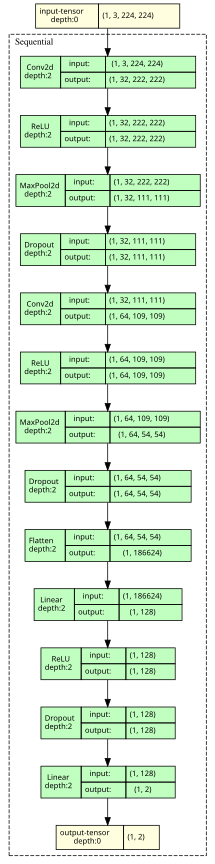

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 32, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.25),

        nn.Conv2d(32, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.25),

        nn.Flatten(),
        nn.Linear(186624, 128),
        nn.ReLU(),
        nn.Dropout(0.25),
        nn.Linear(128, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/25]	 Train Loss: 2.18	 Val Loss: 0.69	 Val Acc = 0.51
Epoch: [2/25]	 Train Loss: 0.69	 Val Loss: 0.69	 Val Acc = 0.40
Epoch: [3/25]	 Train Loss: 0.67	 Val Loss: 0.67	 Val Acc = 0.63
Epoch: [4/25]	 Train Loss: 0.59	 Val Loss: 0.65	 Val Acc = 0.63
Epoch: [5/25]	 Train Loss: 0.57	 Val Loss: 0.67	 Val Acc = 0.59
Epoch: [6/25]	 Train Loss: 0.49	 Val Loss: 0.74	 Val Acc = 0.57
Epoch: [7/25]	 Train Loss: 0.49	 Val Loss: 0.83	 Val Acc = 0.62
Epoch: [8/25]	 Train Loss: 0.50	 Val Loss: 0.74	 Val Acc = 0.66
Epoch: [9/25]	 Train Loss: 0.56	 Val Loss: 0.91	 Val Acc = 0.60
Epoch: [10/25]	 Train Loss: 0.47	 Val Loss: 1.02	 Val Acc = 0.66
Epoch: [11/25]	 Train Loss: 0.42	 Val Loss: 1.09	 Val Acc = 0.65
Epoch: [12/25]	 Train Loss: 0.42	 Val Loss: 1.13	 Val Acc = 0.68
Epoch: [13/25]	 Train Loss: 0.40	 Val Loss: 1.08	 Val Acc = 0.66
Epoch: [14/25]	 Train Loss: 0.37	 Val Loss: 1.17	 Val Acc = 0.69
Epoch: [15/25]	 Train Loss: 0.38	 Val Loss: 1.31	 Val Acc = 0.69
Epoch: [16/25]	 Train Loss: 0.34	 

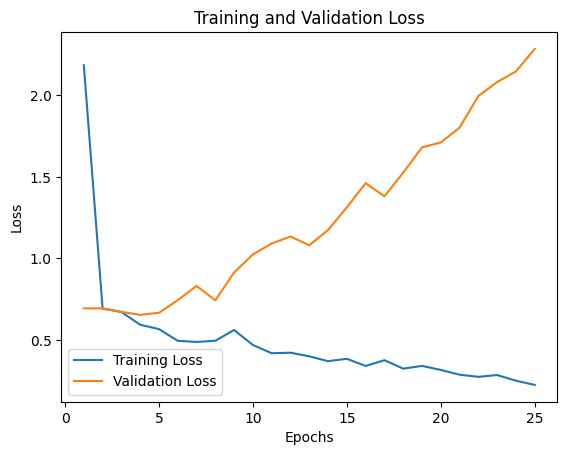

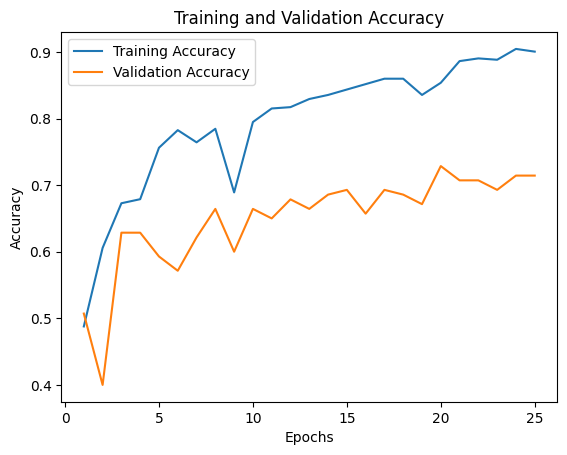

Test set accuracy: 0.64


In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 25, device = device
)

#plot
plot_results_new(history)

#predict
predictions, labels = model_predict(save_path, test_dl, device)

### run 5 b (without dropout)

results
- train error goes to 0, acc to 100
- val error declines, then rises until 5.4 with acc incr then decr
- test set acc is 49%.. very bad

obs
- significant overfit starts from the beginning
- even a simple model as this overfits when no regularization is used

W1031 13:42:50.153000 2020 torch/_inductor/utils.py:1436] [0/0] Not enough SMs to use max_autotune_gemm mode


Epoch: [1/25]	 Train Loss: 1.69	 Val Loss: 0.70	 Val Acc = 0.51
Epoch: [2/25]	 Train Loss: 0.67	 Val Loss: 0.69	 Val Acc = 0.51
Epoch: [3/25]	 Train Loss: 0.57	 Val Loss: 0.96	 Val Acc = 0.51
Epoch: [4/25]	 Train Loss: 0.52	 Val Loss: 1.16	 Val Acc = 0.69
Epoch: [5/25]	 Train Loss: 0.48	 Val Loss: 1.12	 Val Acc = 0.69
Epoch: [6/25]	 Train Loss: 0.42	 Val Loss: 1.43	 Val Acc = 0.73
Epoch: [7/25]	 Train Loss: 0.39	 Val Loss: 1.51	 Val Acc = 0.72
Epoch: [8/25]	 Train Loss: 0.34	 Val Loss: 1.80	 Val Acc = 0.72
Epoch: [9/25]	 Train Loss: 0.31	 Val Loss: 1.61	 Val Acc = 0.70
Epoch: [10/25]	 Train Loss: 0.27	 Val Loss: 2.38	 Val Acc = 0.69
Epoch: [11/25]	 Train Loss: 0.23	 Val Loss: 1.96	 Val Acc = 0.68
Epoch: [12/25]	 Train Loss: 0.19	 Val Loss: 3.01	 Val Acc = 0.71
Epoch: [13/25]	 Train Loss: 0.15	 Val Loss: 2.53	 Val Acc = 0.66
Epoch: [14/25]	 Train Loss: 0.11	 Val Loss: 4.08	 Val Acc = 0.62
Epoch: [15/25]	 Train Loss: 0.16	 Val Loss: 2.04	 Val Acc = 0.65
Epoch: [16/25]	 Train Loss: 0.11	 

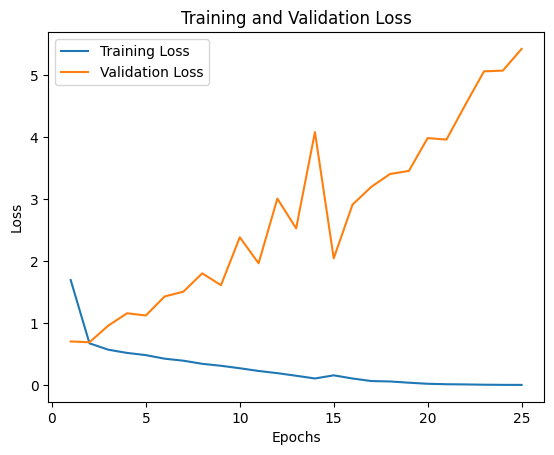

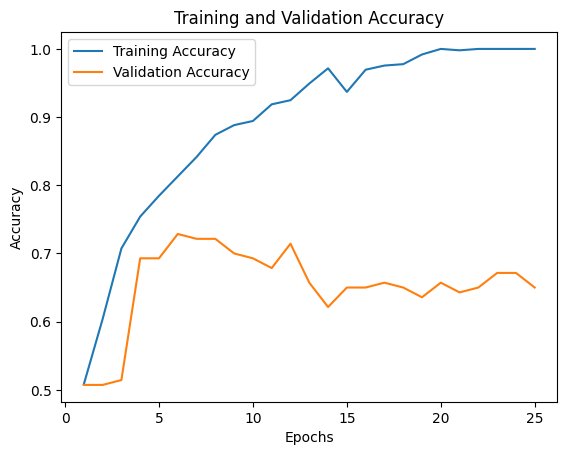

Test set accuracy: 0.49


In [ ]:
# ARCHITECTURE

class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 32, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),

        nn.Conv2d(32, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),

        nn.Flatten(),
        nn.Linear(186624, 128),
        nn.ReLU(),
        nn.Linear(128, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph


# TRAINING

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save_optim(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 25, device = device
)

#plot
plot_results_new(history)


# PREDICT
predictions, labels = model_predict(save_path, test_dl, device)

### run 5c (batch_norm)

setup

- same as run 5 but with Batch norm in the CONV layers
- used 15 epochs

results
- reduction in performance across all metrics.. even comparing with the first 15 epochs of run 5

obs
- this is weird coz i have always had the sense that batch norm should improve performance

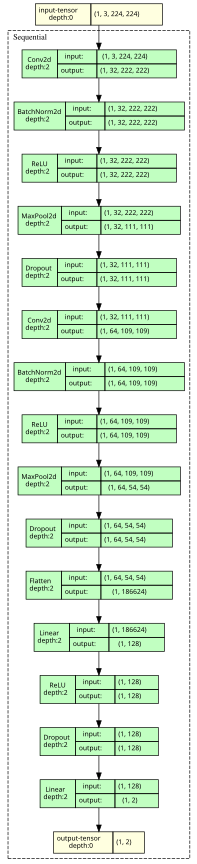

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 32, kernel_size = 3),
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.25),

        nn.Conv2d(32, 64, kernel_size = 3),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.25),

        nn.Flatten(),
        nn.Linear(186624, 128),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(128, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/15]	 Train Loss: 12.89	 Val Loss: 5.21	 Val Acc = 0.46
Epoch: [2/15]	 Train Loss: 2.59	 Val Loss: 1.50	 Val Acc = 0.56
Epoch: [3/15]	 Train Loss: 0.58	 Val Loss: 1.64	 Val Acc = 0.53
Epoch: [4/15]	 Train Loss: 0.55	 Val Loss: 1.72	 Val Acc = 0.57
Epoch: [5/15]	 Train Loss: 0.52	 Val Loss: 2.52	 Val Acc = 0.56
Epoch: [6/15]	 Train Loss: 0.54	 Val Loss: 2.26	 Val Acc = 0.56
Epoch: [7/15]	 Train Loss: 0.51	 Val Loss: 2.28	 Val Acc = 0.57
Epoch: [8/15]	 Train Loss: 0.51	 Val Loss: 2.34	 Val Acc = 0.57
Epoch: [9/15]	 Train Loss: 0.51	 Val Loss: 2.26	 Val Acc = 0.57
Epoch: [10/15]	 Train Loss: 0.48	 Val Loss: 2.16	 Val Acc = 0.56
Epoch: [11/15]	 Train Loss: 0.47	 Val Loss: 2.36	 Val Acc = 0.56
Epoch: [12/15]	 Train Loss: 0.53	 Val Loss: 2.74	 Val Acc = 0.54
Epoch: [13/15]	 Train Loss: 0.51	 Val Loss: 1.80	 Val Acc = 0.59
Epoch: [14/15]	 Train Loss: 0.52	 Val Loss: 2.37	 Val Acc = 0.56
Epoch: [15/15]	 Train Loss: 0.51	 Val Loss: 2.11	 Val Acc = 0.56


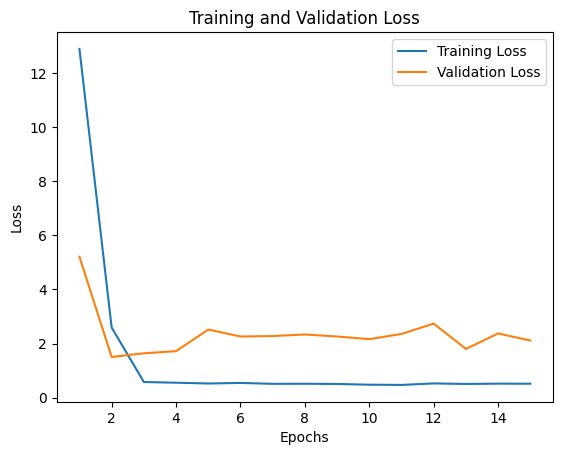

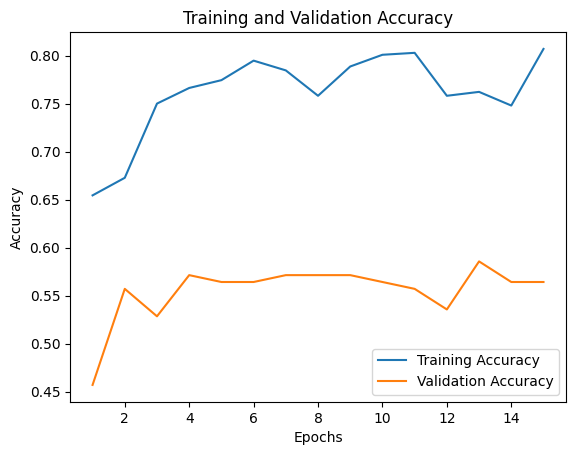

Test set accuracy: 0.53


In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex1_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 15, device = device
)

#plot
plot_results_new(history)

#predict
predictions, labels = model_predict(save_path, test_dl, device)

### run 5d (more complex)

We double the features being learnt in the 2 layers

## EXPERIMENT 2 (with augmentation)

### Data Pipeline

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

from torchview import draw_graph

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

train_td = ImageFolder(root = './train', transform = T.Compose([
    T.Resize((224, 224)),
    T.RandomHorizontalFlip(p = 0.5),
    T.ToTensor()
]))

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

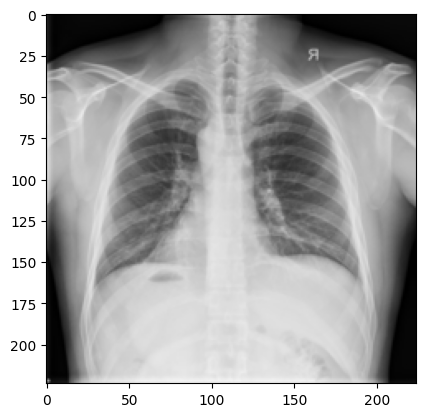

In [ ]:
plt.imshow(train_td[0][0].permute(1, 2, 0));

### run 1 (with horizontal flip)

setup

- same setup as the best model in Experiment 1
- here we introduce random horizontal flip

results
- train error does not go to 0 and acc peaks at 80
- drop in val error, but drop in val acc as well, with peak at 64
- test acc is 56 with auc of 64

obs
- it looks like augmentation is not the best overfit strategy for this model, since the performance on the train, val and test set was better in the dropout only strategy.

Epoch: [1/25]	 Train Loss: 2.70	 Val Loss: 0.69	 Train Acc = 0.53	 Val Acc = 0.49
Epoch: [2/25]	 Train Loss: 0.69	 Val Loss: 0.69	 Train Acc = 0.49	 Val Acc = 0.49
Epoch: [3/25]	 Train Loss: 0.70	 Val Loss: 0.69	 Train Acc = 0.49	 Val Acc = 0.49
Epoch: [4/25]	 Train Loss: 0.70	 Val Loss: 0.69	 Train Acc = 0.49	 Val Acc = 0.49
Epoch: [5/25]	 Train Loss: 0.69	 Val Loss: 0.69	 Train Acc = 0.50	 Val Acc = 0.49
Epoch: [6/25]	 Train Loss: 0.68	 Val Loss: 0.68	 Train Acc = 0.58	 Val Acc = 0.61
Epoch: [7/25]	 Train Loss: 0.63	 Val Loss: 0.64	 Train Acc = 0.64	 Val Acc = 0.64
Epoch: [8/25]	 Train Loss: 0.59	 Val Loss: 0.64	 Train Acc = 0.71	 Val Acc = 0.56
Epoch: [9/25]	 Train Loss: 0.59	 Val Loss: 0.63	 Train Acc = 0.69	 Val Acc = 0.61
Epoch: [10/25]	 Train Loss: 0.50	 Val Loss: 0.70	 Train Acc = 0.72	 Val Acc = 0.54
Epoch: [11/25]	 Train Loss: 0.54	 Val Loss: 0.63	 Train Acc = 0.75	 Val Acc = 0.61
Epoch: [12/25]	 Train Loss: 0.51	 Val Loss: 0.66	 Train Acc = 0.78	 Val Acc = 0.58
Epoch: [13/25

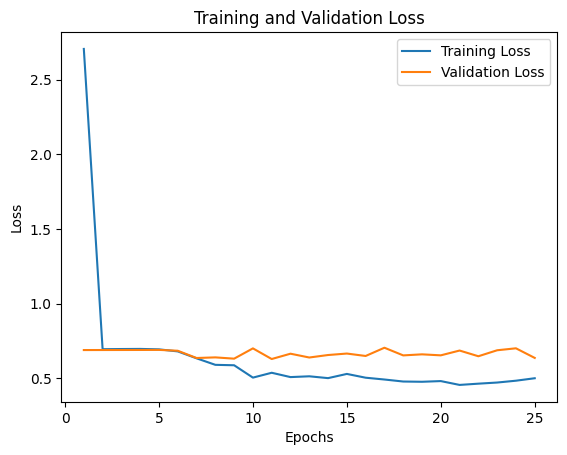

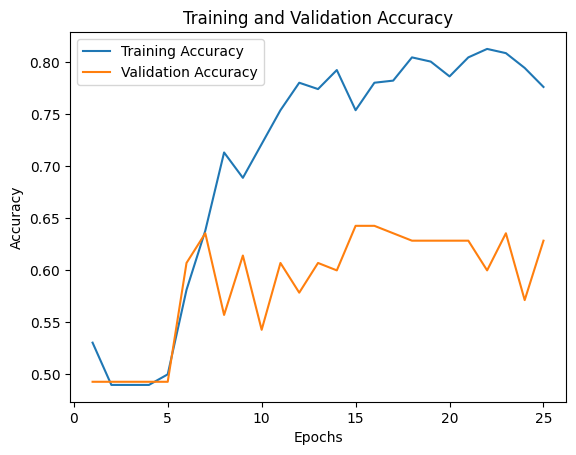

Test set accuracy: 0.56
Test set AUC: 0.64


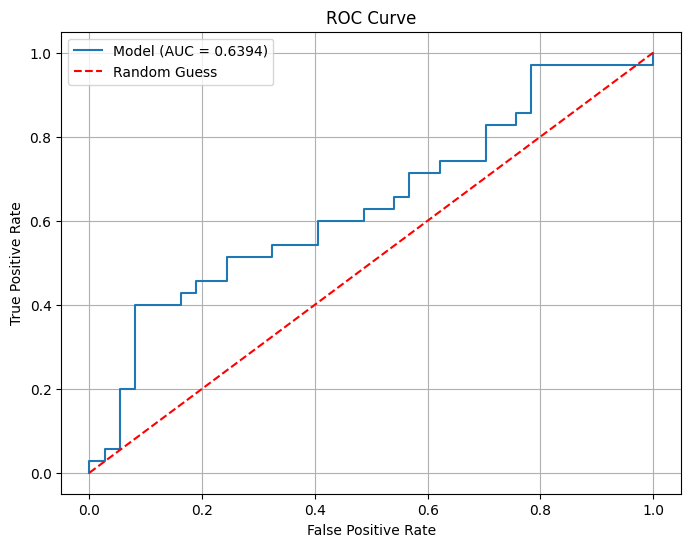

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 32, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.25),

        nn.Conv2d(32, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.25),

        nn.Flatten(),
        nn.Linear(186624, 128),
        nn.ReLU(),
        nn.Dropout(0.25),
        nn.Linear(128, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

# TRAINING
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex2_run1.pt'

history = model_train_save_optim(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 25, device = device
)

#plot
plot_results_new(history)

# total time taken for training and validation
print(f"Training time : {sum(history['Train']['Time'])}")
print(f"Validation time : {sum(history['Val']['Time'])}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

### run 2 (+ rotation)

results

- train loss and acc are stable..acc peaking at 83
- both acc and auc on test set have increased as compared to only when flipping was used.. acc is 60, auc is 66

obs

- looks like it is a good idea to do both flipping and rotation. it may increase the training time though.

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

from torchview import draw_graph

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

train_td = ImageFolder(root = './train', transform = T.Compose([
    T.Resize((224, 224)),
    T.RandomHorizontalFlip(p = 0.5),
    T.RandomRotation(10),
    T.ToTensor()
]))

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

Epoch: [1/25]	 Train Loss: 3.69	    Val Loss: 0.69	 Train Acc: 0.51	 Val Acc: 0.52    Train Time: 1.07	 Val Time: 0.5589922070503235
Epoch: [2/25]	 Train Loss: 0.69	    Val Loss: 0.69	 Train Acc: 0.57	 Val Acc: 0.46    Train Time: 0.97	 Val Time: 0.4884597937266032
Epoch: [3/25]	 Train Loss: 0.69	    Val Loss: 0.69	 Train Acc: 0.63	 Val Acc: 0.56    Train Time: 1.00	 Val Time: 0.4861236890157064
Epoch: [4/25]	 Train Loss: 0.65	    Val Loss: 0.73	 Train Acc: 0.64	 Val Acc: 0.51    Train Time: 1.06	 Val Time: 0.5719130674997965
Epoch: [5/25]	 Train Loss: 0.63	    Val Loss: 0.73	 Train Acc: 0.64	 Val Acc: 0.54    Train Time: 0.97	 Val Time: 0.5281222303708394
Epoch: [6/25]	 Train Loss: 0.56	    Val Loss: 0.88	 Train Acc: 0.68	 Val Acc: 0.56    Train Time: 1.07	 Val Time: 0.549633797009786
Epoch: [7/25]	 Train Loss: 0.51	    Val Loss: 0.79	 Train Acc: 0.76	 Val Acc: 0.56    Train Time: 1.06	 Val Time: 0.4902911464373271
Epoch: [8/25]	 Train Loss: 0.50	    Val Loss: 0.93	 Train Acc: 0.79	 V

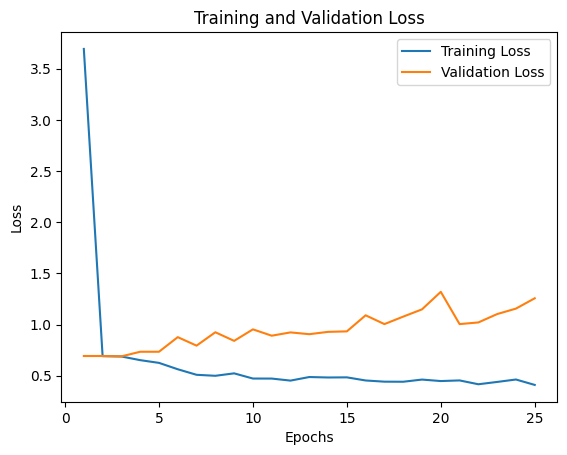

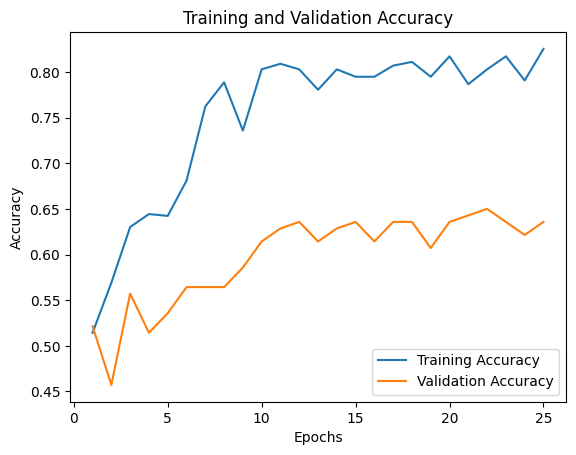

KeyError: 'Train'

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 32, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.25),

        nn.Conv2d(32, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.25),

        nn.Flatten(),
        nn.Linear(186624, 128),
        nn.ReLU(),
        nn.Dropout(0.25),
        nn.Linear(128, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

# TRAINING
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex2_run1.pt'

history = model_train_save(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 25, device = device
)

#plot
plot_results_new(history)

# total time taken for training and validation
print(f"Training time : {sum(history['Training']['Time']):.2f}")
print(f"Validation time : {sum(history['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

Training time : 25.30311440229416
Validation time : 13.14044162829717
Test set accuracy: 0.60
Test set AUC: 0.66
Time: 0.38


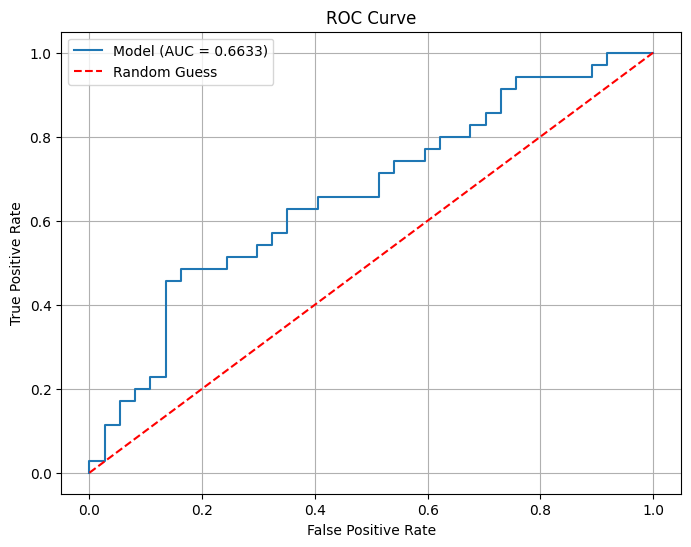

In [ ]:
# total time taken for training and validation
print(f"Training time : {sum(history['Training']['Time']):.2f}")
print(f"Validation time : {sum(history['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

### run 3 (+ model complex)

In [ ]:
path_classification = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/classification'

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

from torchview import draw_graph

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

train_td = ImageFolder(root = './train', transform = T.Compose([
    T.Resize((224, 224)),
    T.RandomHorizontalFlip(p = 0.5),
    T.RandomRotation(10),
    T.ToTensor()
]))

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

Epoch: [1/25]	 Train Loss: 5.11	    Val Loss: 0.70	 Train Acc: 0.49	 Val Acc: 0.51    Train Time: 1.08	 Val Time: 0.50
Epoch: [2/25]	 Train Loss: 0.69	    Val Loss: 0.70	 Train Acc: 0.50	 Val Acc: 0.52    Train Time: 1.07	 Val Time: 0.51
Epoch: [3/25]	 Train Loss: 0.65	    Val Loss: 0.97	 Train Acc: 0.63	 Val Acc: 0.49    Train Time: 1.13	 Val Time: 0.50
Epoch: [4/25]	 Train Loss: 0.55	    Val Loss: 1.45	 Train Acc: 0.72	 Val Acc: 0.54    Train Time: 1.02	 Val Time: 0.51
Epoch: [5/25]	 Train Loss: 0.52	    Val Loss: 1.76	 Train Acc: 0.78	 Val Acc: 0.52    Train Time: 1.01	 Val Time: 0.51
Epoch: [6/25]	 Train Loss: 0.51	    Val Loss: 1.52	 Train Acc: 0.79	 Val Acc: 0.55    Train Time: 1.02	 Val Time: 0.50
Epoch: [7/25]	 Train Loss: 0.49	    Val Loss: 1.52	 Train Acc: 0.78	 Val Acc: 0.55    Train Time: 1.03	 Val Time: 0.49
Epoch: [8/25]	 Train Loss: 0.51	    Val Loss: 1.27	 Train Acc: 0.77	 Val Acc: 0.55    Train Time: 1.04	 Val Time: 0.51
Epoch: [9/25]	 Train Loss: 0.47	    Val Loss: 1.

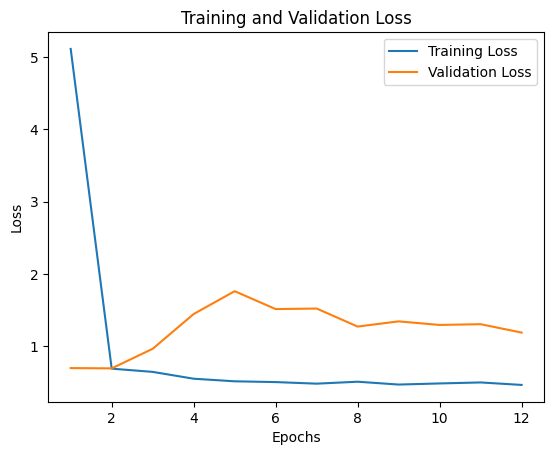

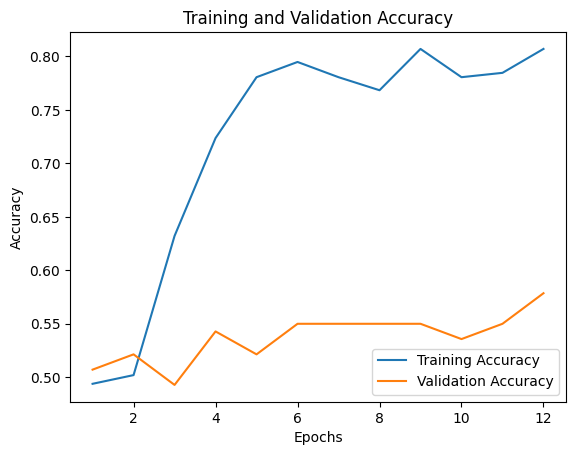

Training time : 12.53
Validation time : 6.02
Prediction Metrics
Confusion Matrix: [[37  0]
 [33  2]]
Test Accuracy: 0.54
Test f1: 0.11
Test AUC: 0.67
Time: 0.39


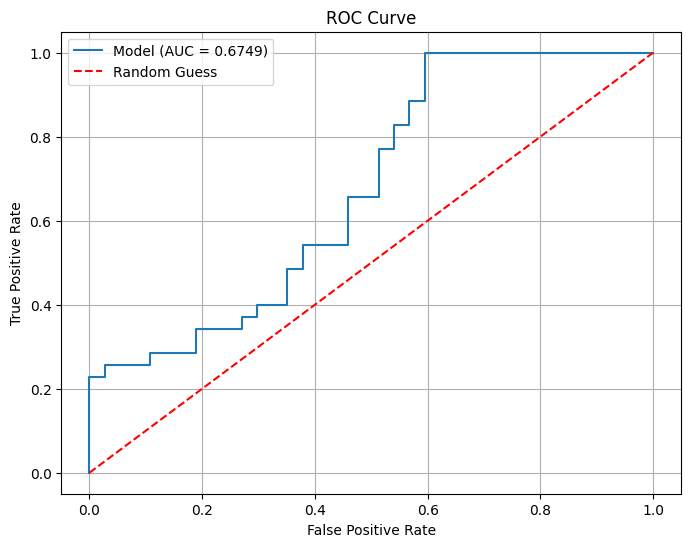

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.2),

        nn.Conv2d(128, 256, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.1),

        nn.Flatten(),
        nn.Linear(746496, 128),
        nn.ReLU(),
        nn.Dropout(0.15),
        nn.Linear(128, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

# TRAINING
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = os.path.join(path_classification, 'ex2_run3.pt')

history = model_train_save_es(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 25, patience = 10, device = device
)

#plot
plot_results_new(history)

# total time taken for training and validation
print(f"Training time : {sum(history['Training']['Time']):.2f}")
print(f"Validation time : {sum(history['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

# EXPERIMENT 3 (Shekar Paper, 2025)

I will try to reproduce the results of this paper using this small dataset. If it fails, I will download the actual dataset and try it out

## 4200 DATA SETUP

In [ ]:
## Download data

import kagglehub

# Download latest version
path_rahman = kagglehub.dataset_download("tawsifurrahman/tuberculosis-tb-chest-xray-dataset")

print("Path to dataset files:", path_rahman)

100%|██████████| 663M/663M [00:30<00:00, 22.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/tawsifurrahman/tuberculosis-tb-chest-xray-dataset/versions/3


In [ ]:
import os

os.listdir(path_rahman+'/TB_Chest_Radiography_Database')

['Normal',
 'Normal.metadata.xlsx',
 'Tuberculosis.metadata.xlsx',
 'README.md.txt',
 'Tuberculosis']

In [ ]:
tb_md = pd.read_excel(os.path.join(path_rahman,'TB_Chest_Radiography_Database', 'Tuberculosis.metadata.xlsx'))
display(tb_md.head())
display(tb_md.info())

no_tb_md = pd.read_excel(os.path.join(path_rahman,'TB_Chest_Radiography_Database', 'Normal.metadata.xlsx'))
display(no_tb_md.head())
display(no_tb_md.info())

,FILE NAME,FORMAT,SIZE,URL
0,Tuberculosis-1,PNG,512*512,http://tuberculosis.by/
1,Tuberculosis-2,PNG,512*512,http://tuberculosis.by/
2,Tuberculosis-3,PNG,512*512,http://tuberculosis.by/
3,Tuberculosis-4,PNG,512*512,http://tuberculosis.by/
4,Tuberculosis-5,PNG,512*512,http://tuberculosis.by/


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   FILE NAME  700 non-null    object
 1   FORMAT     700 non-null    object
 2   SIZE       700 non-null    object
 3   URL        700 non-null    object
dtypes: object(4)
memory usage: 22.0+ KB


None

,FILE NAME,FORMAT,SIZE,URL
0,Normal-1,PNG,512*512,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...
1,Normal-2,PNG,512*512,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...
2,Normal-3,PNG,512*512,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...
3,Normal-4,PNG,512*512,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...
4,Normal-5,PNG,512*512,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   FILE NAME  3500 non-null   object
 1   FORMAT     3500 non-null   object
 2   SIZE       3500 non-null   object
 3   URL        3500 non-null   object
dtypes: object(4)
memory usage: 109.5+ KB


None

In [ ]:
# os.listdir(os.path.join(path_rahman,'TB_Chest_Radiography_Database', 'Tuberculosis'))

In [ ]:
# def database_setup(path):
#   import os

In [ ]:
import os
import pandas as pd

# load the metadata
# metadata = pd.read_csv(os.path.join(path, 'MetaData.csv'))
# display (metadata.head())

# Get the ids of the images corr to TB and no-TB
img_id1 = list (tb_md['FILE NAME'])
img_id0 = list(no_tb_md['FILE NAME'])

print()
print(f'# of TB images: {len(img_id1)}')
print(f'# of Normal images: {len(img_id0)}')
print(f'Total: {len(img_id1) + len(img_id0)}')
print(img_id1[:5]) #the list is ordered in ascending
print(img_id0[:5])


# We will split train, validation and test set using 70%, 20% and 10%.
# We will consider these ratios at the class level since we want every set
# have a balanced number of images wrt the classes.

train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# int uses floor, so the test set will have a couple more images than intended
# This is stratified sampling
train_no_1 = int(train_ratio * len(img_id1))
train_no_0 = int(train_ratio * len(img_id0))
print(f'Train: {train_no_1} + {train_no_0} = {train_no_1 + train_no_0}')

val_no_1 = int(val_ratio * len(img_id1))
val_no_0 = int(val_ratio * len(img_id0))
print(f'Validation: {val_no_1} + {val_no_0} = {val_no_1 + val_no_0}')

test_no_1 = int(test_ratio * len(img_id1))
test_no_0 = int(test_ratio * len(img_id0))
print(f'Test: {test_no_1} + {test_no_0} = {test_no_1 + test_no_0}')

# split
train_1 = img_id1[:train_no_1]
train_0 = img_id0[:train_no_0]
train = train_1 + train_0
print(f'Train set #: {len(train)}')

val_1 = img_id1[train_no_1:train_no_1 + val_no_1]
val_0 = img_id0[train_no_0:train_no_0 + val_no_0]
val = val_1 + val_0
print(f'Validation set #: {len(val)}')

test_1 = img_id1[train_no_1 + val_no_1:]
test_0 = img_id0[train_no_0 + val_no_0:]
test = test_1 + test_0
print(f'Test set #: {len(test)}')

print(f'Total: {len(train) + len(val) + len(test)}')


# of TB images: 700
# of Normal images: 3500
Total: 4200
['Tuberculosis-1', 'Tuberculosis-2', 'Tuberculosis-3', 'Tuberculosis-4', 'Tuberculosis-5']
['Normal-1', 'Normal-2', 'Normal-3', 'Normal-4', 'Normal-5']
Train: 560 + 2800 = 3360
Validation: 70 + 350 = 420
Test: 70 + 350 = 420
Train set #: 3360
Validation set #: 420
Test set #: 420
Total: 4200


In [ ]:
## set up directories

import os
import shutil

sets = ['train', 'val', 'test']
klases = ['tb', 'no_tb']

current_path = os.getcwd()

# train_dir = os.makedirs(os.path.join(current_path, sets[0]))
# val_dir = os.makedirs(os.path.join(current_path, sets[1]))
# test_dir = os.makedirs(os.path.join(current_path, sets[2]))

for s in sets:
    for klas in klases:
      if not os.path.exists(os.path.join(current_path, s, klas)):
        os.makedirs(os.path.join(current_path, s, klas))

path_tb_images = os.path.join(path_rahman, 'TB_Chest_Radiography_Database', 'Tuberculosis')
path_no_tb_images = os.path.join(path_rahman, 'TB_Chest_Radiography_Database', 'Normal')


# copying from the image path to set up directories

#train
for i in train_1:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_tb_images,str_i), dst = os.path.join(current_path,'train/tb'))

for i in train_0:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_no_tb_images,str_i), dst = os.path.join(current_path,'train/no_tb'))

# val
for i in val_1:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_tb_images,str_i), dst = os.path.join(current_path,'val/tb'))

for i in val_0:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_no_tb_images,str_i), dst = os.path.join(current_path,'val/no_tb'))

#test
for i in test_1:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_tb_images,str_i), dst = os.path.join(current_path,'test/tb'))

for i in test_0:
  str_i = str(i) + '.png' #convert id into image id string
  shutil.copy(src = os.path.join(path_no_tb_images,str_i), dst = os.path.join(current_path,'test/no_tb'))

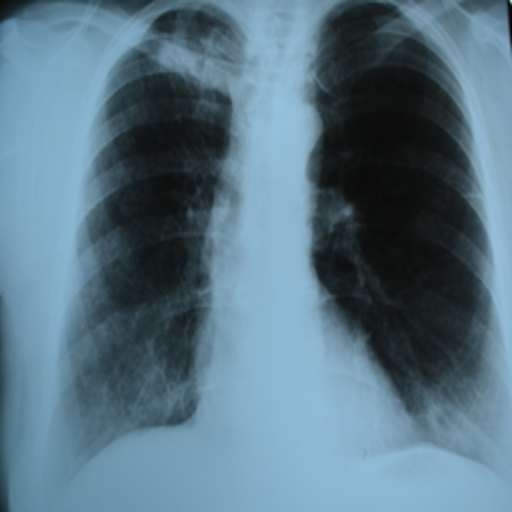

In [ ]:
import PIL

path_image = './train/tb/' + str(train_1[1]) + '.png'
PIL.Image.open(path_image)

### run 1

I have added more data for training the model. My goal is to confirm the results reported by the Shekar paper. I expect the performance will improve though not as reported by Shekar, that will be such a drastic improvement!

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim


from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

from torchview import draw_graph
# from utils import model_train_save, model_predict, plot_results_new

# TRANSFORMS

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

# TENSOR DATASETS
train_td = ImageFolder(root = './train', transform = transforms)
val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

# print(train_td[0][0])

# TO BATCHES
train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

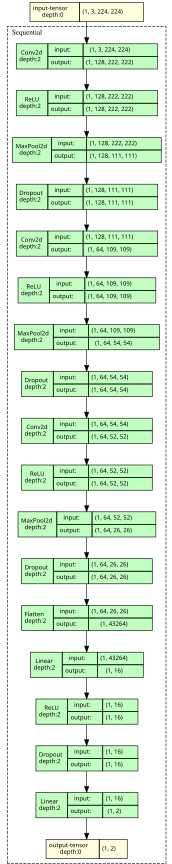

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.3),

        nn.Conv2d(128, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Conv2d(64, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Flatten(),
        nn.Linear(43264, 16),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(16, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/100]	 Train Loss: 0.31	    Val Loss: 0.34	 Train Acc: 0.83	 Val Acc: 0.83    Train Time: 0.90	 Val Time: 0.10
Epoch: [2/100]	 Train Loss: 0.25	    Val Loss: 0.30	 Train Acc: 0.83	 Val Acc: 0.83    Train Time: 0.92	 Val Time: 0.09
Epoch: [3/100]	 Train Loss: 0.22	    Val Loss: 0.25	 Train Acc: 0.88	 Val Acc: 0.95    Train Time: 0.80	 Val Time: 0.09
Epoch: [4/100]	 Train Loss: 0.19	    Val Loss: 0.26	 Train Acc: 0.94	 Val Acc: 0.96    Train Time: 0.79	 Val Time: 0.09
Epoch: [5/100]	 Train Loss: 0.18	    Val Loss: 0.20	 Train Acc: 0.95	 Val Acc: 0.97    Train Time: 0.82	 Val Time: 0.08
Epoch: [6/100]	 Train Loss: 0.18	    Val Loss: 0.18	 Train Acc: 0.96	 Val Acc: 0.96    Train Time: 0.80	 Val Time: 0.09
Epoch: [7/100]	 Train Loss: 0.16	    Val Loss: 0.21	 Train Acc: 0.96	 Val Acc: 0.94    Train Time: 0.79	 Val Time: 0.09
Epoch: [8/100]	 Train Loss: 0.14	    Val Loss: 0.18	 Train Acc: 0.96	 Val Acc: 0.95    Train Time: 0.80	 Val Time: 0.09
Epoch: [9/100]	 Train Loss: 0.13	    Val

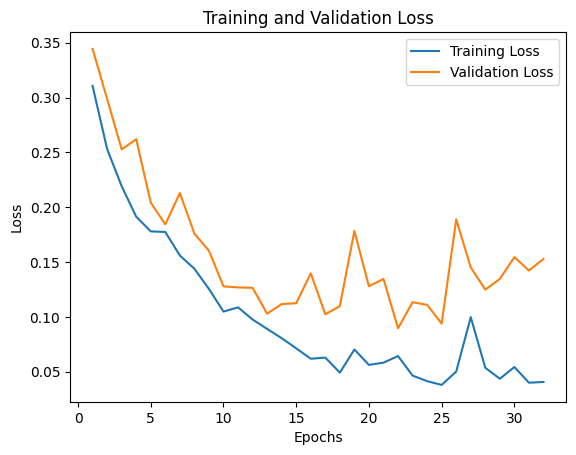

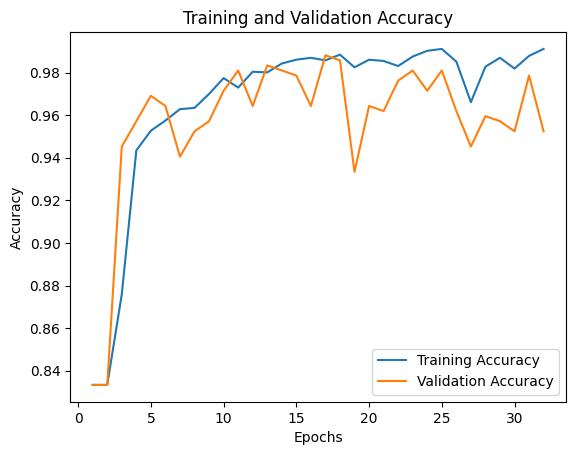

Training time : 25.72
Validation time : 2.85
Prediction Metrics
Confusion Matrix: [[342   8]
 [  2  68]]
Accuracy: 0.98
f1: 0.93
AUC: 0.99
Time: 0.08


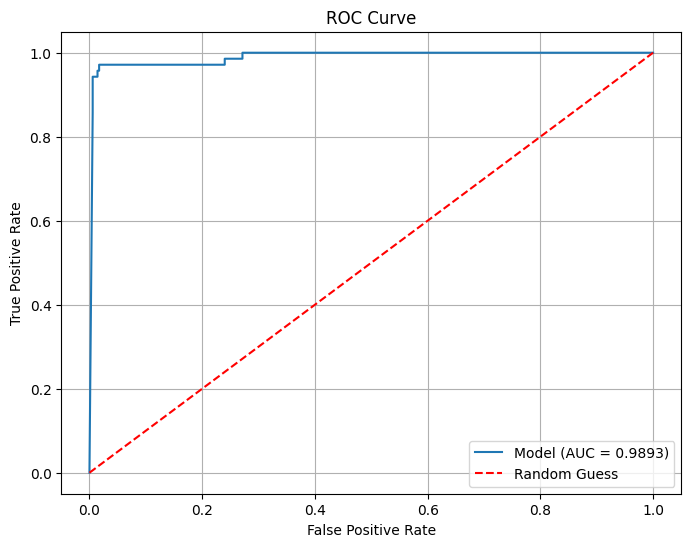

ValueError: too many values to unpack (expected 2)

In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex4_run1.pt'

history = model_train_save_es(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 100, patience = 10, device = device
)

#plot
plot_results_new(history)

# total time taken for training and validation
print(f"Training time : {sum(history['Training']['Time']):.2f}")
print(f"Validation time : {sum(history['Validation']['Time']):.2f}")


#predict
predictions, probs,labels = model_predict_val(save_path, val_dl, device)

Prediction Metrics
Confusion Matrix: [[342   8]
 [  2  68]]
Accuracy: 0.98
f1: 0.93
AUC: 0.99
Time: 0.10


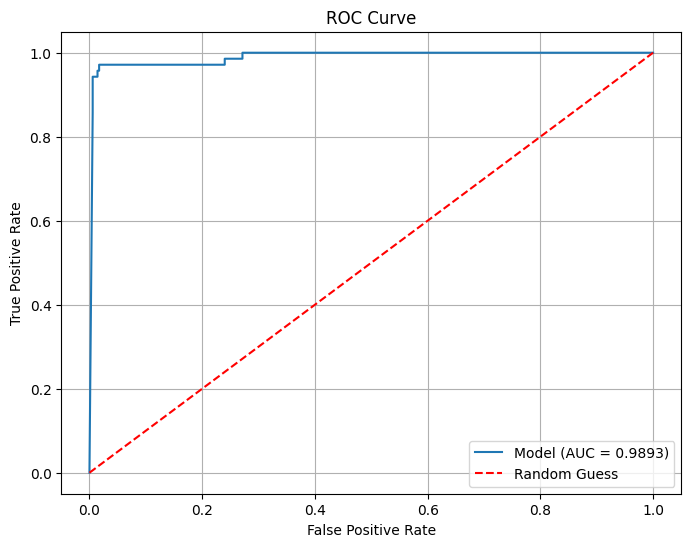

In [ ]:
predictions, probs,labels = model_predict_val(save_path, val_dl, device)

In [ ]:
PATH = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/classification/class_ex3_run1_7400.pt'

torch.save(model.state_dict(), PATH)

### CAM

It was not successful

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.3),

        nn.Conv2d(128, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Conv2d(64, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Flatten(),
        nn.Linear(43264, 16),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(16, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model.load_state_dict(torch.load(PATH, weights_only = True))

<All keys matched successfully>

In [ ]:
print(model)

CNN(
  (layers): Sequential(
    (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout(p=0.3, inplace=False)
    (4): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Dropout(p=0.5, inplace=False)
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
    (9): ReLU()
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Dropout(p=0.5, inplace=False)
    (12): Flatten(start_dim=1, end_dim=-1)
    (13): Linear(in_features=43264, out_features=16, bias=True)
    (14): ReLU()
    (15): Dropout(p=0.2, inplace=False)
    (16): Linear(in_features=16, out_features=2, bias=True)
  )
)


#### grad-CAM

Loading model...
Loading and processing image...
Running Grad-CAM...
Visualizing results...


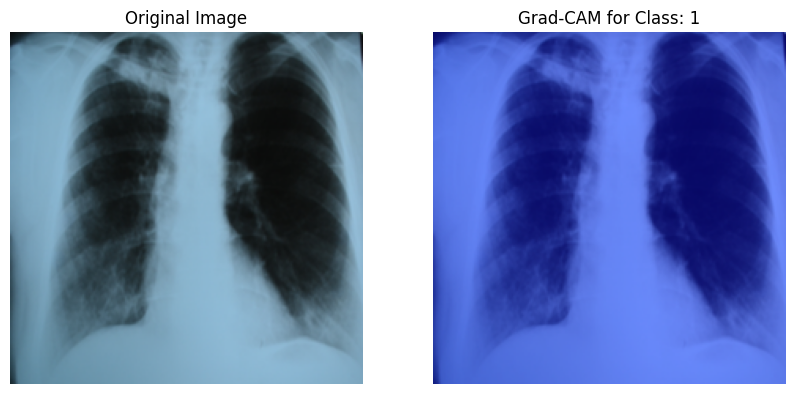

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

print("Loading model...")
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# D. Set to evaluation mode! This is CRITICAL for BatchNorm and Dropout.
model.eval()
model = model.to(device)


# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# Grad-CAM works by looking at the gradients of the *last convolutional layer*.
target_layer = model.layers[8]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
print("Loading and processing image...")
IMAGE_PATH = './train/tb/' + str(train_1[1]) + '.png'
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# You MUST use the exact same validation transforms as your model.
# The VGG16 default transforms are perfect for this.
val_transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
])


input_tensor = val_transforms(img_pil).unsqueeze(0).to(device) # [1, 3, 224, 224]

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
print("Running Grad-CAM...")
# A. Initialize GradCAM
cam = GradCAM(model=model,
              target_layers=[target_layer],
              )


TARGET_CLASS = 1
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the model, gets gradients and activations, and computes the map
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the first (and only) map from the batch.. this is the combo of all maps
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
print("Visualizing results...")
# Get the permuted image for plotting
rgb_img_for_plot = input_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

Loading model...
Loading and processing image...
Running Grad-CAM...
Visualizing results...


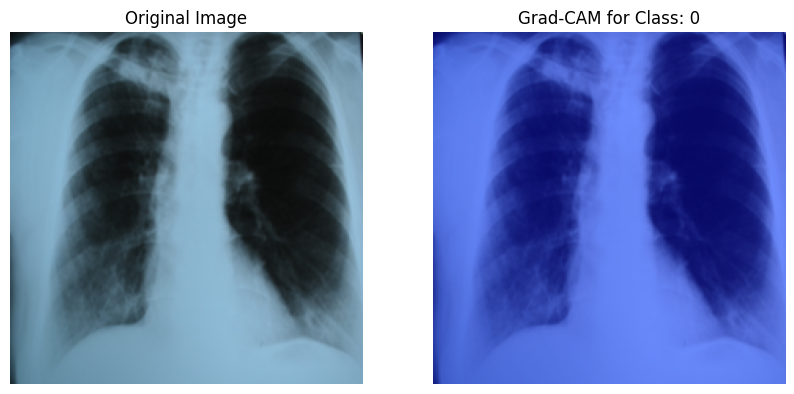

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

print("Loading model...")
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# D. Set to evaluation mode! This is CRITICAL for BatchNorm and Dropout.
model.eval()
model = model.to(device)


# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# Grad-CAM works by looking at the gradients of the *last convolutional layer*.
target_layer = model.layers[8]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
print("Loading and processing image...")
IMAGE_PATH = './train/tb/' + str(train_1[1]) + '.png'
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# You MUST use the exact same validation transforms as your model.
# The VGG16 default transforms are perfect for this.
val_transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
])


input_tensor = val_transforms(img_pil).unsqueeze(0).to(device) # [1, 3, 224, 224]

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
print("Running Grad-CAM...")
# A. Initialize GradCAM
cam = GradCAM(model=model,
              target_layers=[target_layer],
              )


TARGET_CLASS = 0
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the model, gets gradients and activations, and computes the map
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the first (and only) map from the batch.. this is the combo of all maps
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
print("Visualizing results...")
# Get the permuted image for plotting
rgb_img_for_plot = input_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

#### score-CAM

Loading model...
Loading and processing image...
Running Grad-CAM...


100%|██████████| 4/4 [00:00<00:00, 16.12it/s]


Visualizing results...


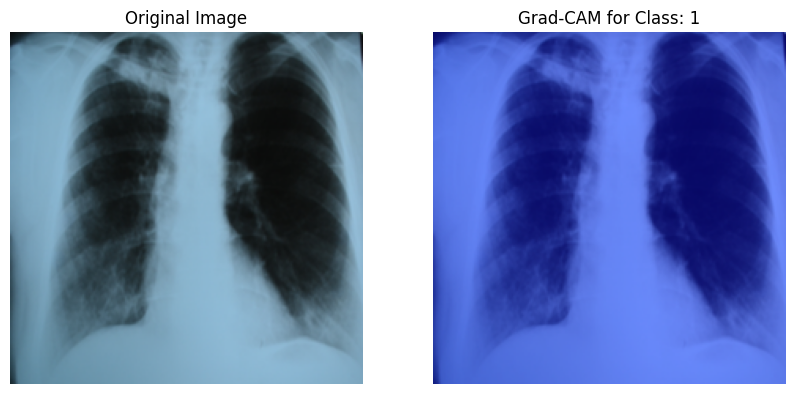

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM, ScoreCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

print("Loading model...")
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# D. Set to evaluation mode! This is CRITICAL for BatchNorm and Dropout.
model.eval()
model = model.to(device)


# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# Grad-CAM works by looking at the gradients of the *last convolutional layer*.
target_layer = model.layers[8]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
print("Loading and processing image...")
IMAGE_PATH = './train/tb/' + str(train_1[1]) + '.png'
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# You MUST use the exact same validation transforms as your model.
# The VGG16 default transforms are perfect for this.
val_transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
])


input_tensor = val_transforms(img_pil).unsqueeze(0).to(device) # [1, 3, 224, 224]

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
print("Running Grad-CAM...")
# A. Initialize GradCAM
cam = ScoreCAM(model=model,
              target_layers=[target_layer],
              )


TARGET_CLASS = 1
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the model, gets gradients and activations, and computes the map
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the first (and only) map from the batch.. this is the combo of all maps
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
print("Visualizing results...")
# Get the permuted image for plotting
rgb_img_for_plot = input_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

## 704 DATA

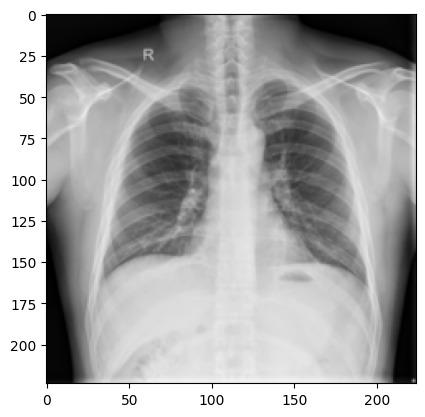

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

from torchview import draw_graph
# from utils import model_train_save, model_predict, plot_results_new

# TRANSFORMS

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

# TENSOR DATASETS
train_td = ImageFolder(root = './train', transform = transforms)
val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

# print(train_td[0][0])

# TO BATCHES
train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

plt.imshow(train_td[0][0].permute(1, 2, 0));

### run 1

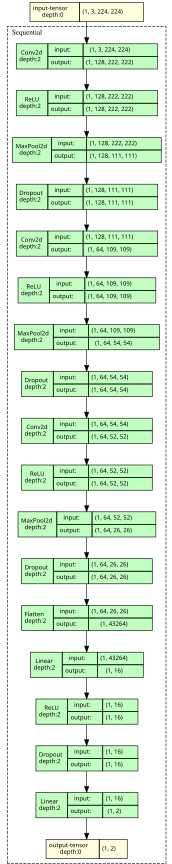

In [ ]:
class CNN(nn.Module):

  def __init__(self, n_classes = 2):
    super().__init__()

    self.layers = nn.Sequential (
        nn.Conv2d(in_channels=3, out_channels = 128, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2, stride = 2),
        nn.Dropout(0.3),

        nn.Conv2d(128, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Conv2d(64, 64, kernel_size = 3),
        nn.ReLU(),
        nn.MaxPool2d(2, 2),
        nn.Dropout(0.5),

        nn.Flatten(),
        nn.Linear(43264, 16),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(16, 2),
    )

  def forward(self, x):
    return self.layers(x)

model = CNN()

model_graph = draw_graph(model, input_size=(1, 3, 224, 224),
                         expand_nested=True,
                         hide_inner_tensors=True,
                         hide_module_functions=True
                         )

model_graph.visual_graph

Epoch: [1/100]	 Train Loss: 0.77	    Val Loss: 0.71	 Train Acc: 0.50	 Val Acc: 0.51    Train Time: 1.06	 Val Time: 0.53
Epoch: [2/100]	 Train Loss: 0.70	    Val Loss: 0.71	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 1.01	 Val Time: 0.48
Epoch: [3/100]	 Train Loss: 0.70	    Val Loss: 0.71	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 0.99	 Val Time: 0.51
Epoch: [4/100]	 Train Loss: 0.70	    Val Loss: 0.71	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 0.98	 Val Time: 0.49
Epoch: [5/100]	 Train Loss: 0.69	    Val Loss: 0.71	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 0.99	 Val Time: 0.48
Epoch: [6/100]	 Train Loss: 0.68	    Val Loss: 0.70	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 1.01	 Val Time: 0.49
Epoch: [7/100]	 Train Loss: 0.68	    Val Loss: 0.70	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 1.31	 Val Time: 0.49
Epoch: [8/100]	 Train Loss: 0.67	    Val Loss: 0.70	 Train Acc: 0.51	 Val Acc: 0.51    Train Time: 1.00	 Val Time: 0.56
Epoch: [9/100]	 Train Loss: 0.66	    Val

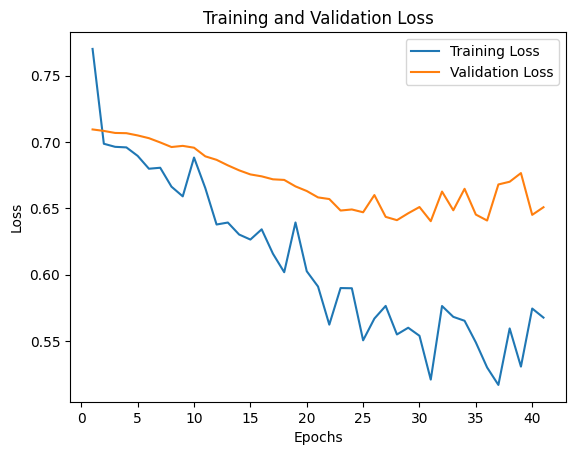

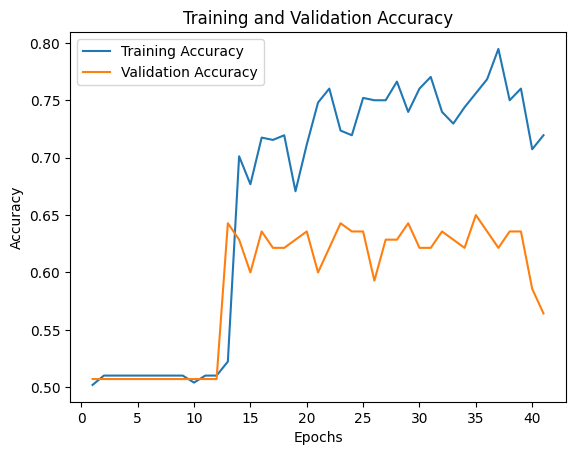

Training time : 40.79
Validation time : 20.36
Prediction Metrics


AttributeError: 'Tensor' object has no attribute 'mumpy'

In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(model.parameters(), lr = 0.001)

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
save_path = './ex4_run1.pt'

history = model_train_save_es(model, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 100, patience = 10, device = device
)

#plot
plot_results_new(history)

# total time taken for training and validation
print(f"Training time : {sum(history['Training']['Time']):.2f}")
print(f"Validation time : {sum(history['Validation']['Time']):.2f}")


#predict
predictions, labels = model_predict_val(save_path, val_dl, device)

Prediction Metrics
Confusion Matrix: [[35 36]
 [17 52]]
Accuracy: 0.62
f1: 0.66
AUC: 0.66
Time: 0.51


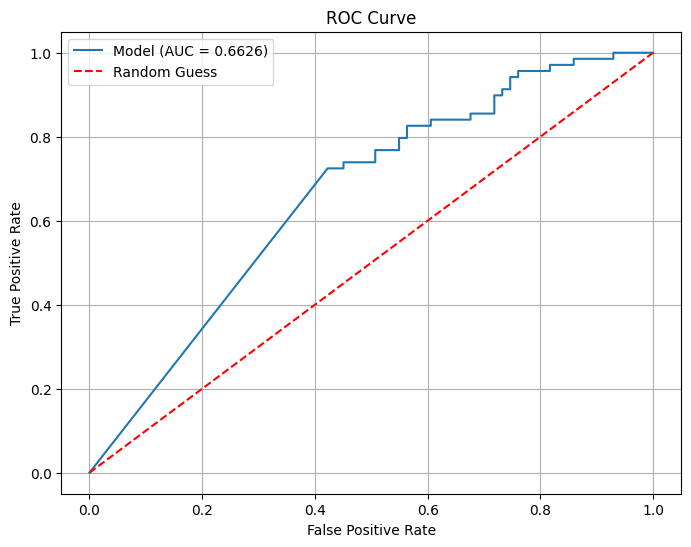

In [ ]:
#predict
predictions, probs, labels = model_predict_val(save_path, val_dl, device)